In [3]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0)

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    image_unflat = image_tensor.detach().cpu().view(-1,*size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1,2,0).squeeze())
    plt.show()

c:\Users\Lenovo\miniconda3\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
def get_generator_block(input_dim,output_dim):
    return nn.Sequential(
        nn.Linear(input_dim,output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True)
    )

In [5]:
class Generator(nn.Module):
    def __init__(self,z_dim=10,im_dim=784,hidden_dim=128):
        super(Generator,self).__init__()  #This call the __init__ method of nn.Module
        self.gen = nn.Sequential(
            get_generator_block(z_dim,hidden_dim),
            get_generator_block(hidden_dim,hidden_dim*2),
            get_generator_block(hidden_dim*2,hidden_dim*4),
            get_generator_block(hidden_dim*4,hidden_dim*8),
            nn.Linear(hidden_dim*8,im_dim),
            nn.Sigmoid()
        )
    def forward(self,noise):
        return self.gen(noise)

In [6]:
def get_noise(n_samples,z_dim,device='cpu'):

    if torch.cuda.is_available():
        return torch.randn(n_samples,z_dim,device=device)
        
    return torch.randn(n_samples,z_dim,device=device)

    

In [7]:
def get_discriminator_block(input_dim,output_dim):
    return nn.Sequential(
        nn.Linear(input_dim,output_dim),
        nn.LeakyReLU(negative_slope=0.2)
    )

In [8]:
class Discriminator(nn.Module):
    def __init__(self,im_dim=784,hidden_dim=128):
        super(Discriminator,self).__init__()
        self.disc=nn.Sequential(
            get_discriminator_block(im_dim,hidden_dim*4),
            get_discriminator_block(hidden_dim*4,hidden_dim*2),
            get_discriminator_block(hidden_dim*2,hidden_dim),
            nn.Linear(hidden_dim,1)
        )

    def forward(self,image):
        return self.disc(image)

In [9]:
criterion =nn.BCEWithLogitsLoss()
n_epochs =200
z_dim=64
display_step=500
batch_size=128 
lr=0.00001

dataloader = DataLoader(
    MNIST('.',download=True,transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True
)

device = 'cuda' if torch.cuda.is_available() else 'cpu'

100%|██████████| 9912422/9912422 [00:14<00:00, 694297.30it/s]


Extracting .\MNIST\raw\train-images-idx3-ubyte.gz to .\MNIST\raw



100%|██████████| 28881/28881 [00:00<00:00, 1087970.23it/s]


Extracting .\MNIST\raw\train-labels-idx1-ubyte.gz to .\MNIST\raw



100%|██████████| 1648877/1648877 [00:02<00:00, 741665.90it/s]


Extracting .\MNIST\raw\t10k-images-idx3-ubyte.gz to .\MNIST\raw



100%|██████████| 4542/4542 [00:00<00:00, 4538001.14it/s]

Extracting .\MNIST\raw\t10k-labels-idx1-ubyte.gz to .\MNIST\raw



In [11]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(),lr=lr)
disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(),lr=lr)

In [13]:
def get_disc_loss(gen,disc,criterion,real,num_images,z_dim,device):
    noise = torch.randn(num_images, z_dim).to(device)
    fake_images=gen(noise)
    
    fake_preds=disc(fake_images.detach())
    fake_labels = torch.zeros_like(fake_preds).to(device)
    fake_loss = criterion(fake_preds, fake_labels)
                          
    real_pred = disc(real)
    real_labels = torch.ones_like(real_pred).to(device)
    real_loss = criterion(real_pred, real_labels)
                          
    disc_loss = (fake_loss + real_loss) / 2
                          
    return disc_loss

In [14]:
def get_gen_loss(gen,disc,criterion,num_images,z_dim,device):
    noise = get_noise(num_images,z_dim,device=device)
    fake_images = gen(noise)
    fake_pred = disc(fake_images)
    gen_labels = torch.ones_like(fake_pred).to(device)
    gen_loss = criterion(fake_pred,gen_labels)

    return gen_loss

  6%|▌         | 29/469 [00:00<00:10, 41.17it/s]

Step 500: Generator loss: 3.5474216585159315, discriminator loss: 0.0738936686441303


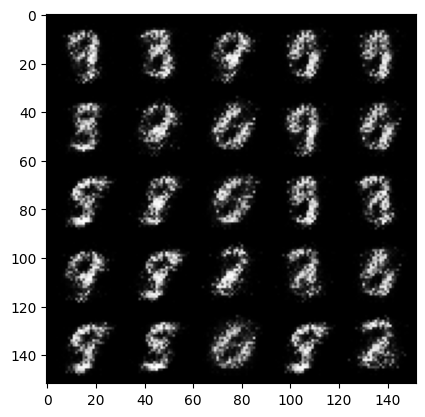

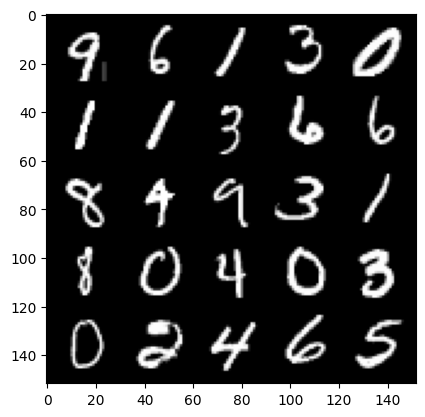

 13%|█▎        | 61/469 [00:01<00:10, 38.27it/s]

Step 1000: Generator loss: 3.940845171928408, discriminator loss: 0.056682229913771226


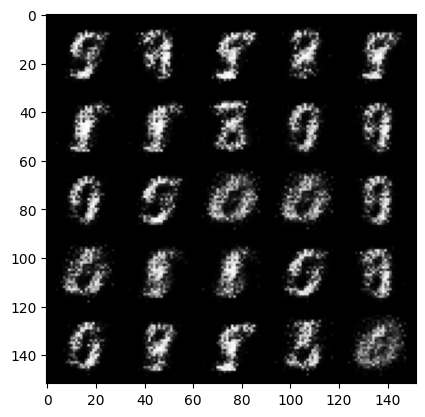

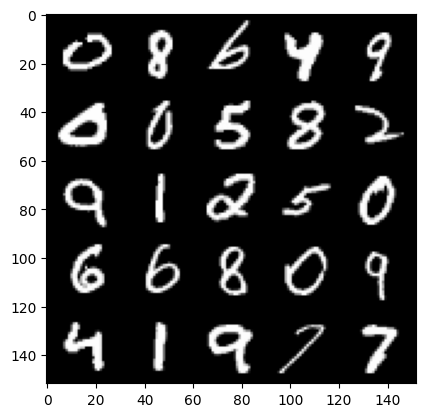

 19%|█▉        | 90/469 [00:02<00:09, 38.18it/s]

Step 1500: Generator loss: 3.9552504491805998, discriminator loss: 0.053175392702221894


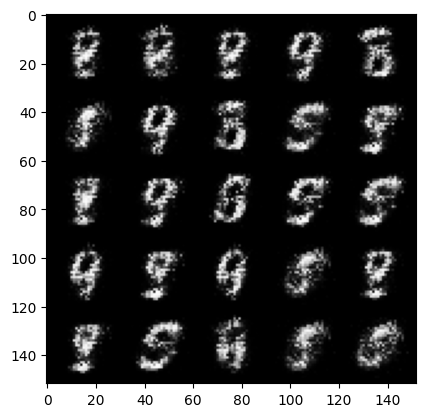

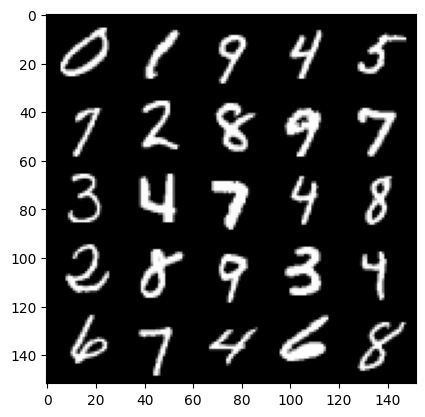

 26%|██▌       | 121/469 [00:03<00:07, 44.08it/s]

Step 2000: Generator loss: 3.870783062934874, discriminator loss: 0.05394594477117055


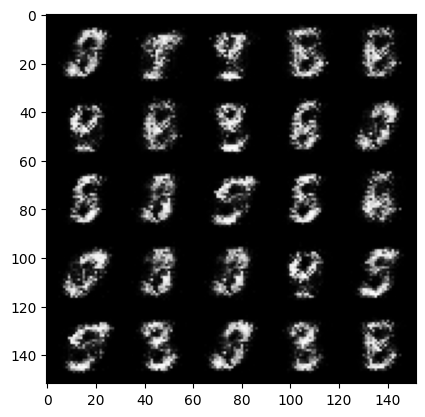

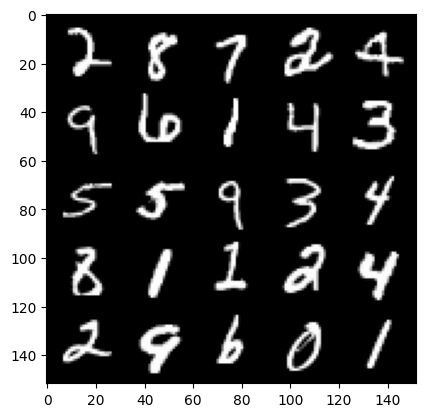

 33%|███▎      | 154/469 [00:03<00:06, 47.66it/s]

Step 2500: Generator loss: 4.197686744689942, discriminator loss: 0.0527618833445013


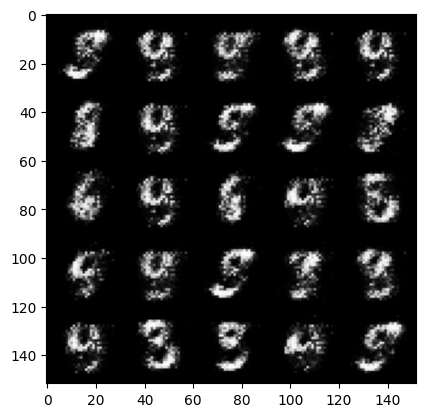

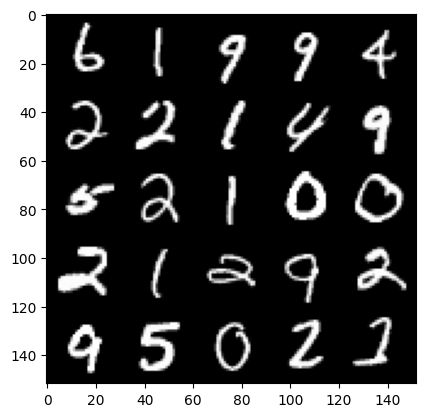

 39%|███▉      | 183/469 [00:05<00:07, 38.09it/s]

Step 3000: Generator loss: 3.926148167133333, discriminator loss: 0.06252036220580338


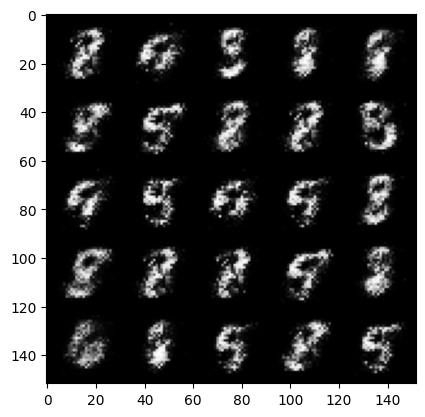

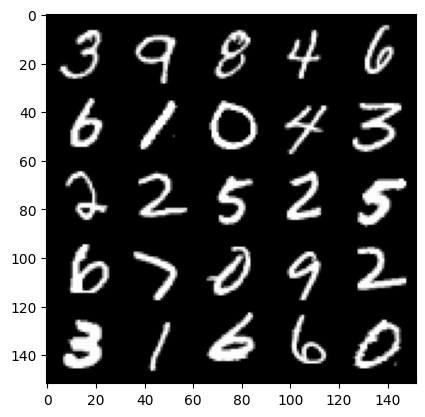

 46%|████▌     | 216/469 [00:05<00:05, 47.85it/s]

Step 3500: Generator loss: 3.8983347167968767, discriminator loss: 0.06038290312513708


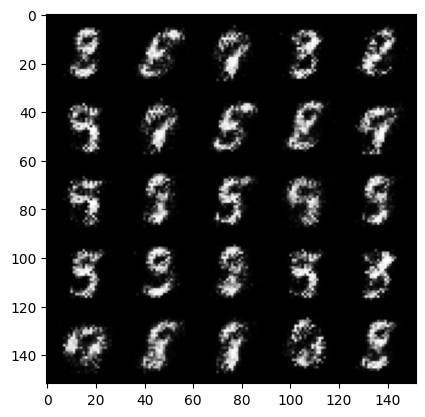

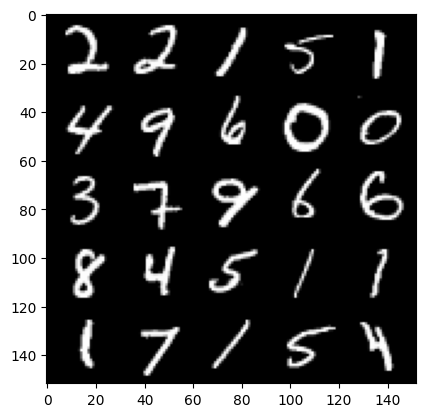

 52%|█████▏    | 246/469 [00:05<00:04, 45.09it/s]

Step 4000: Generator loss: 3.9218347711563095, discriminator loss: 0.05480436242744322


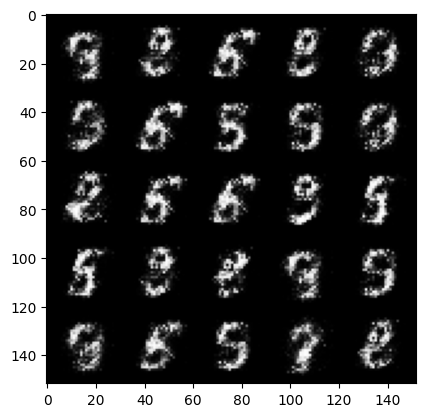

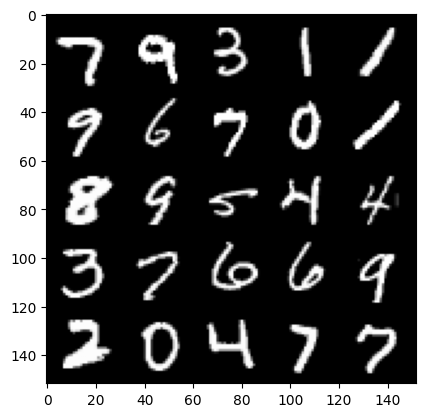

 59%|█████▉    | 276/469 [00:06<00:04, 39.98it/s]

Step 4500: Generator loss: 4.001918210506436, discriminator loss: 0.06272345709800718


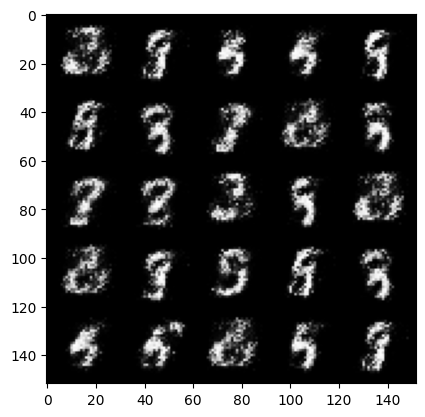

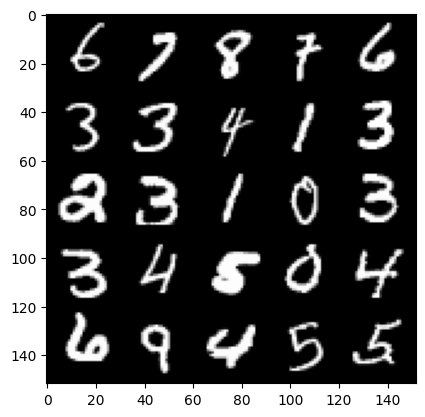

 66%|██████▌   | 309/469 [00:07<00:03, 43.41it/s]

Step 5000: Generator loss: 4.102642096519472, discriminator loss: 0.06897748868167393


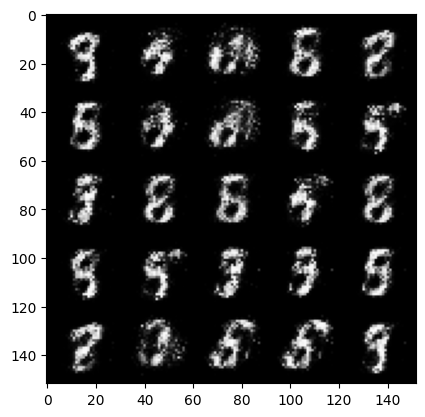

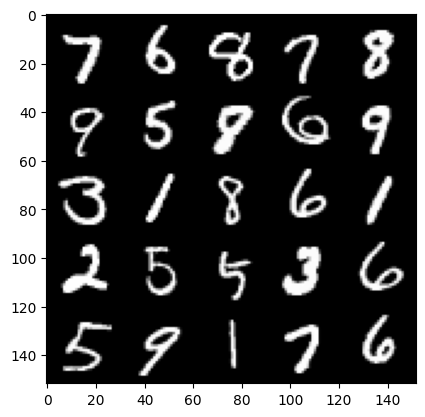

 72%|███████▏  | 340/469 [00:09<00:03, 33.72it/s]

Step 5500: Generator loss: 4.2399732294082595, discriminator loss: 0.06706780854985114


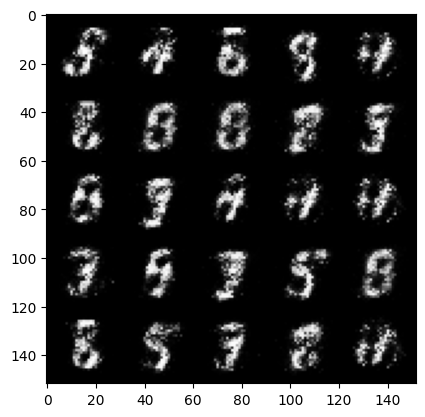

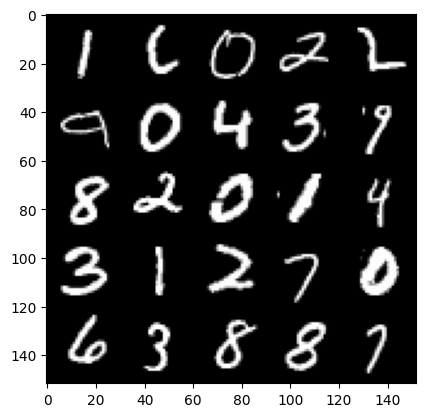

 79%|███████▊  | 369/469 [00:09<00:02, 40.55it/s]

Step 6000: Generator loss: 3.987991795063019, discriminator loss: 0.07693407022207972


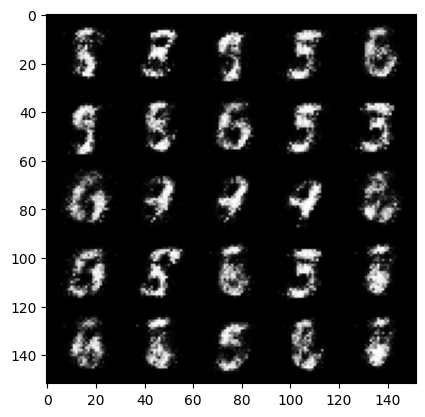

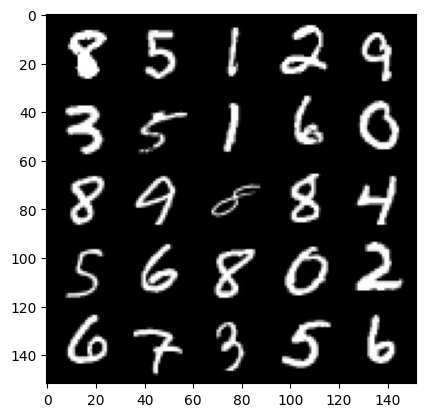

 86%|████████▌ | 403/469 [00:11<00:01, 49.03it/s]

Step 6500: Generator loss: 3.9623645524978657, discriminator loss: 0.08537957824766632


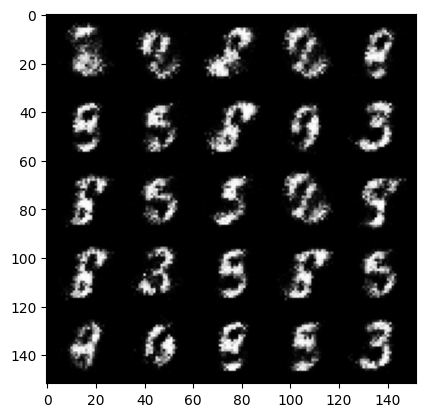

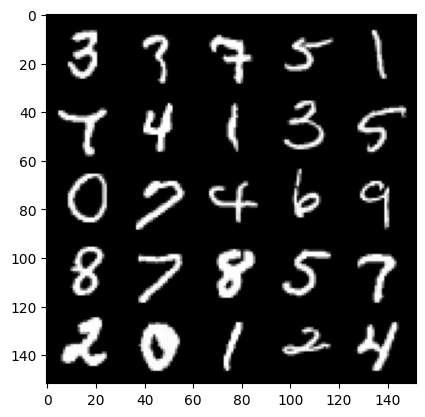

 92%|█████████▏| 431/469 [00:12<00:01, 35.04it/s]

Step 7000: Generator loss: 3.839936134338378, discriminator loss: 0.08752959020435808


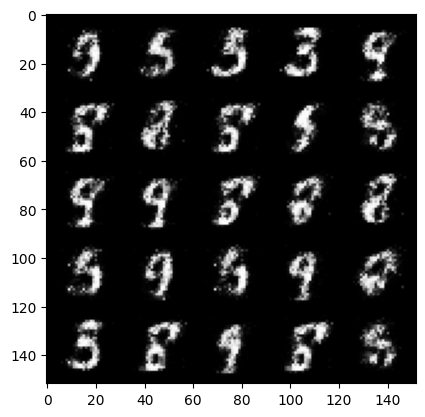

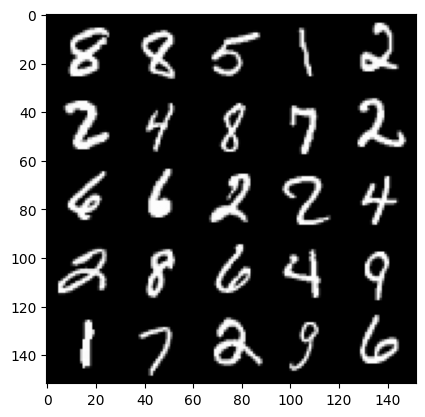

 98%|█████████▊| 461/469 [00:12<00:00, 37.15it/s]

Step 7500: Generator loss: 3.9345731706619276, discriminator loss: 0.07856695854663856


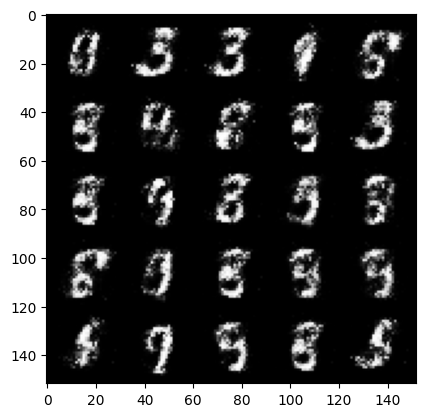

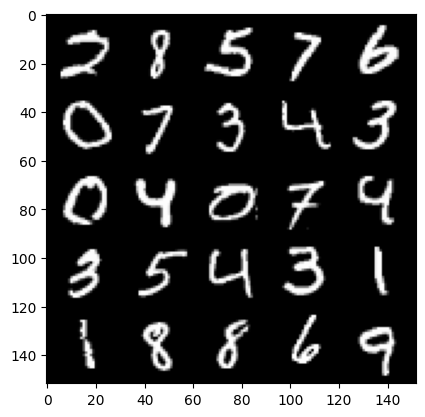

  5%|▌         | 24/469 [00:00<00:14, 31.06it/s]

Step 8000: Generator loss: 4.184926449775694, discriminator loss: 0.08086581491678947


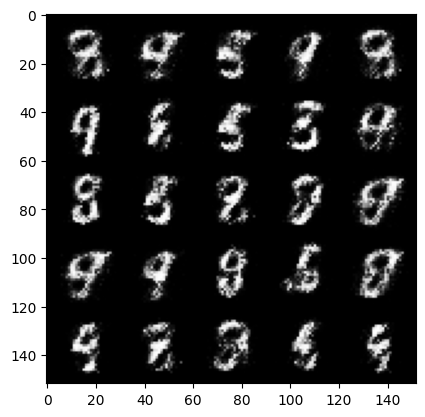

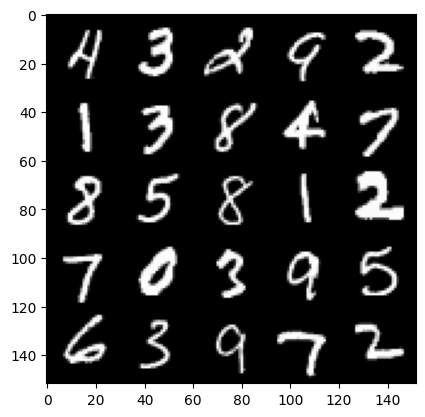

 12%|█▏        | 56/469 [00:01<00:16, 25.50it/s]

Step 8500: Generator loss: 3.8740457496643077, discriminator loss: 0.09626898779720067


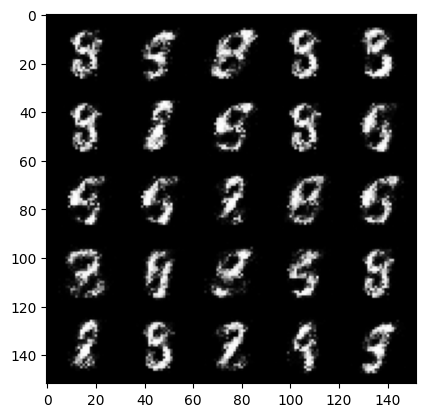

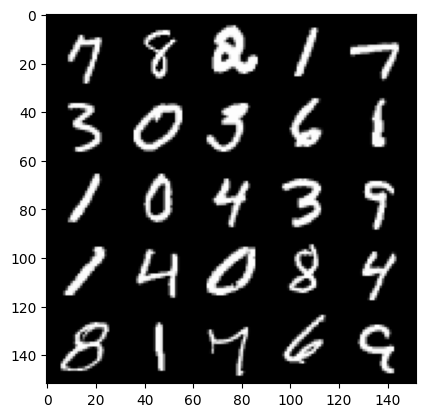

 19%|█▉        | 89/469 [00:02<00:10, 36.74it/s]

Step 9000: Generator loss: 3.8998653497695988, discriminator loss: 0.09673426116257895


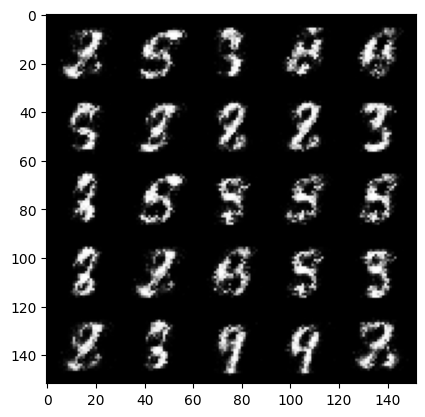

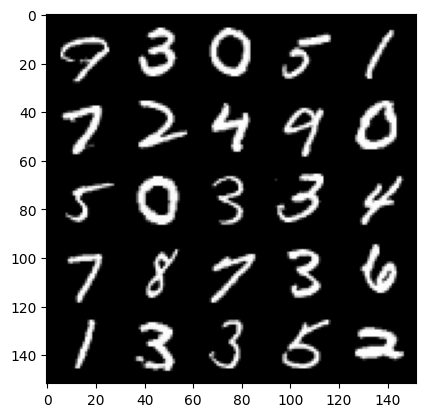

 25%|██▌       | 118/469 [00:03<00:09, 36.41it/s]

Step 9500: Generator loss: 3.9835627722740163, discriminator loss: 0.08984927964955575


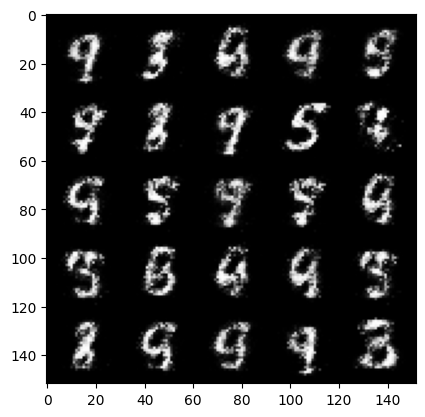

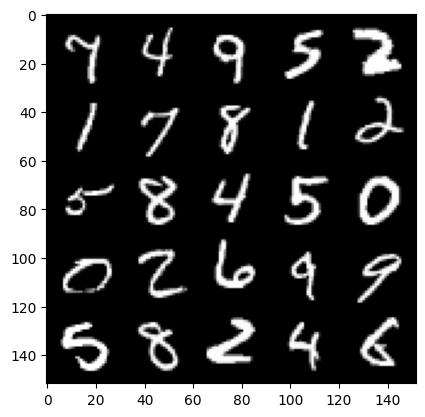

 32%|███▏      | 149/469 [00:04<00:10, 31.85it/s]

Step 10000: Generator loss: 3.6000438895225506, discriminator loss: 0.1160814717039466


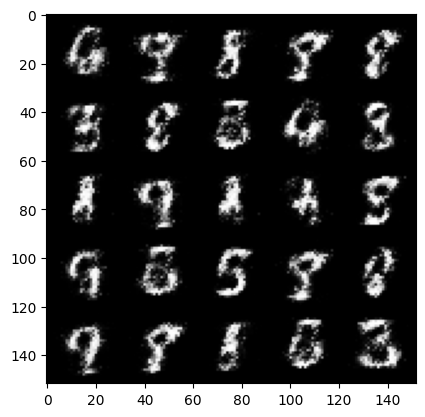

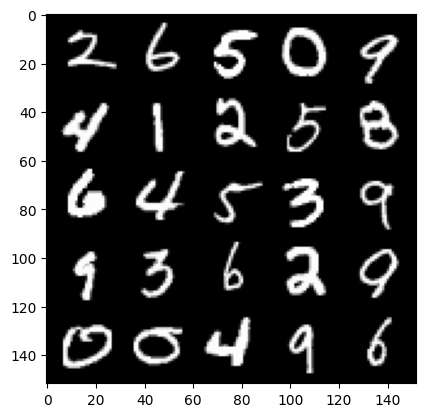

 38%|███▊      | 179/469 [00:04<00:09, 31.40it/s]

Step 10500: Generator loss: 3.692799449920654, discriminator loss: 0.1064075272977351


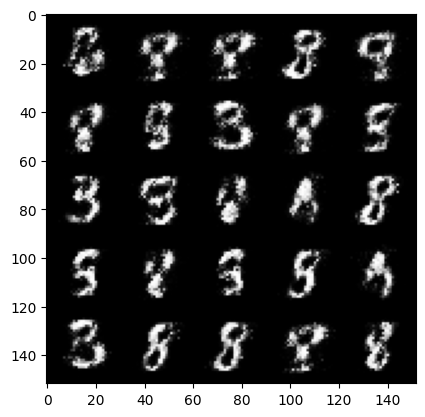

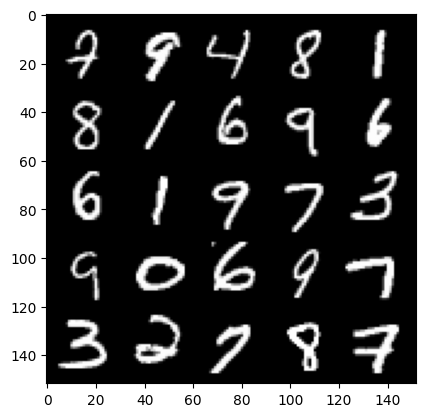

 45%|████▌     | 212/469 [00:06<00:06, 39.65it/s]

Step 11000: Generator loss: 3.6768619065284738, discriminator loss: 0.10354202719777839


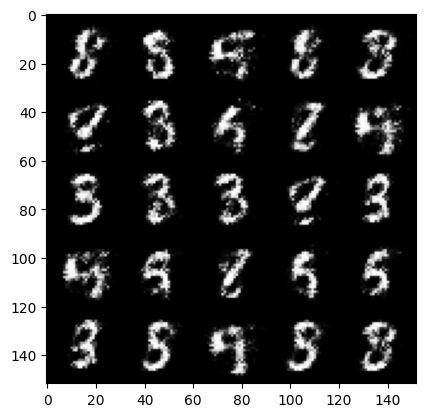

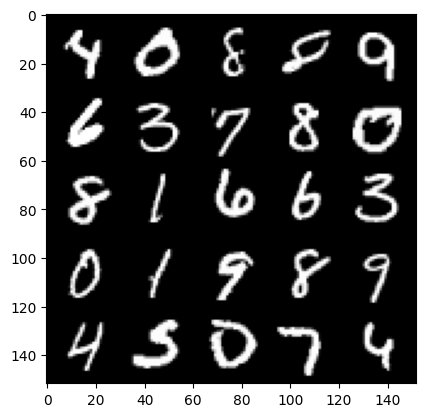

 52%|█████▏    | 242/469 [00:06<00:05, 39.97it/s]

Step 11500: Generator loss: 3.6390238404273996, discriminator loss: 0.11164442238956683


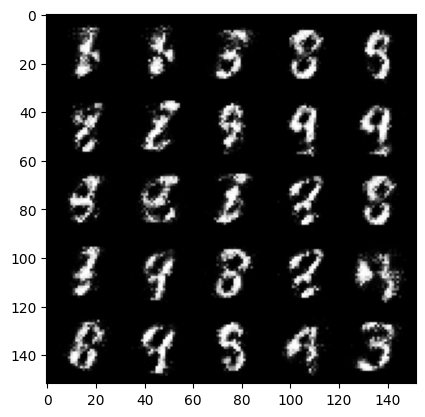

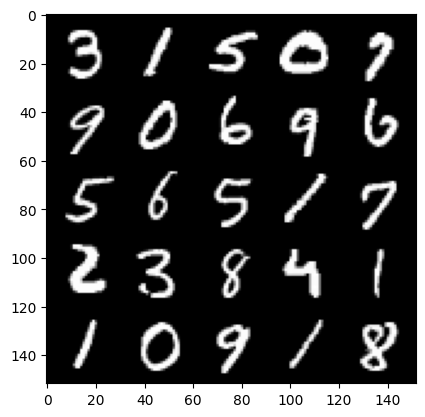

 58%|█████▊    | 274/469 [00:07<00:05, 38.78it/s]

Step 12000: Generator loss: 3.674993068218229, discriminator loss: 0.11010520398616791


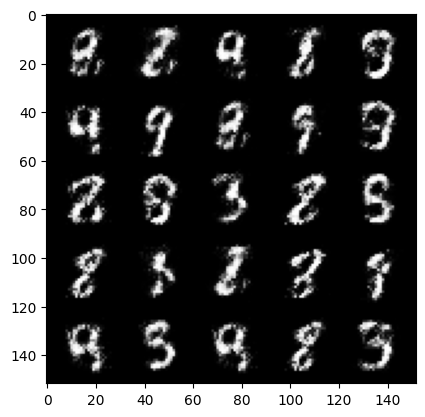

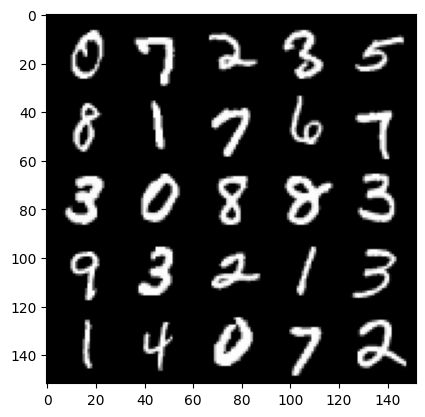

 65%|██████▌   | 306/469 [00:07<00:04, 33.59it/s]

Step 12500: Generator loss: 3.6327588591575606, discriminator loss: 0.12255109417438513


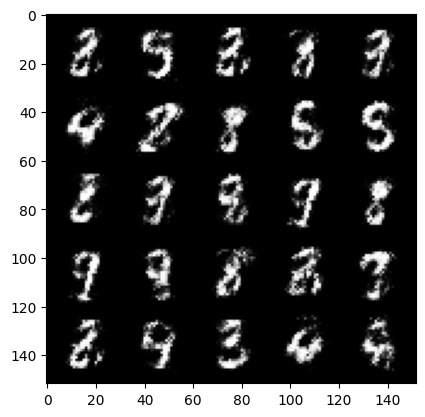

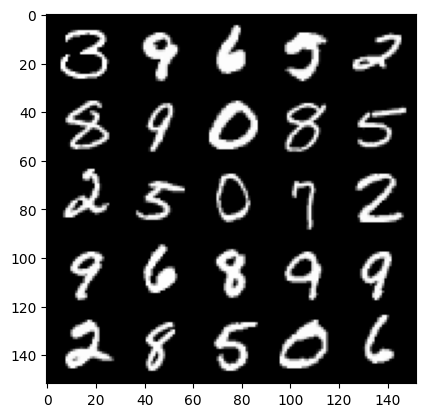

 72%|███████▏  | 337/469 [00:08<00:03, 37.30it/s]

Step 13000: Generator loss: 3.5219710874557486, discriminator loss: 0.13155275687575338


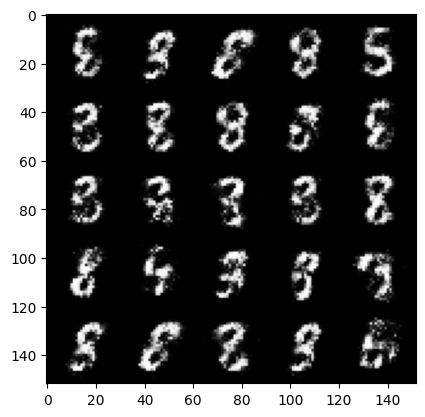

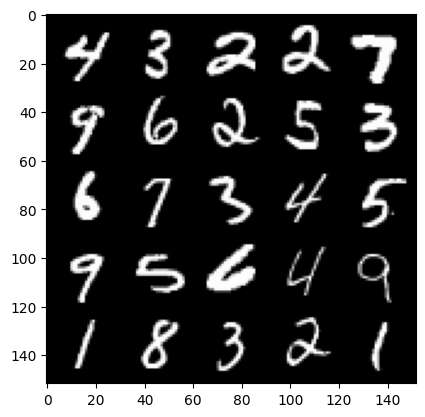

 78%|███████▊  | 364/469 [00:09<00:02, 36.18it/s]

Step 13500: Generator loss: 3.5605720906257634, discriminator loss: 0.14118453058600433


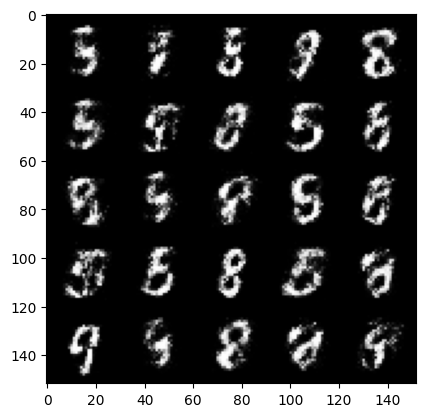

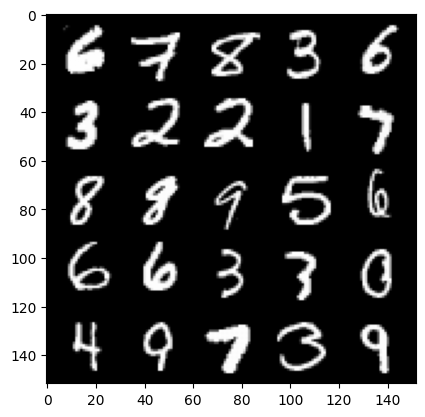

 85%|████████▌ | 399/469 [00:10<00:01, 43.86it/s]

Step 14000: Generator loss: 3.357645978450775, discriminator loss: 0.16147860503196715


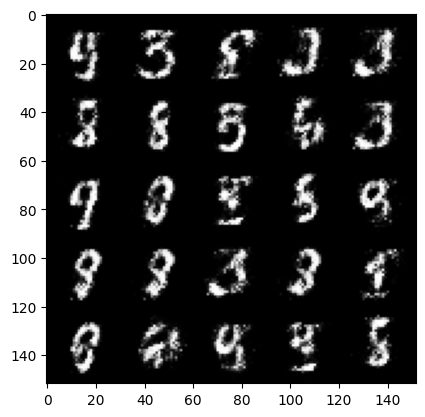

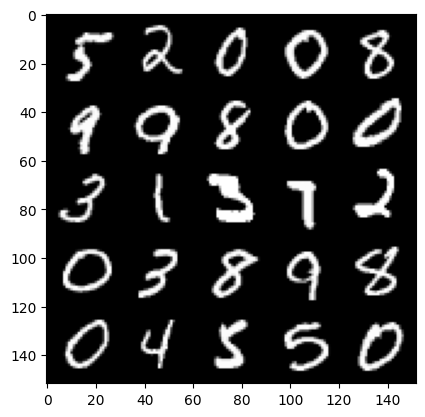

 92%|█████████▏| 430/469 [00:11<00:00, 47.30it/s]

Step 14500: Generator loss: 3.4356525034904495, discriminator loss: 0.1473747172355651


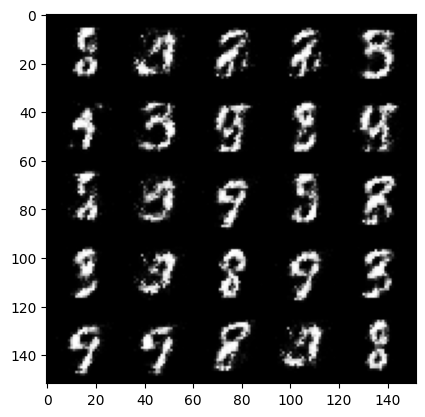

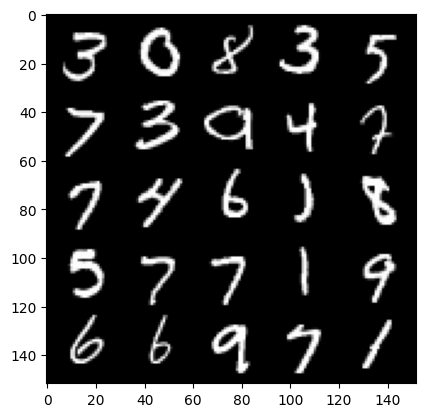

 98%|█████████▊| 459/469 [00:12<00:00, 49.50it/s]

Step 15000: Generator loss: 3.414116064548489, discriminator loss: 0.14609610480070112


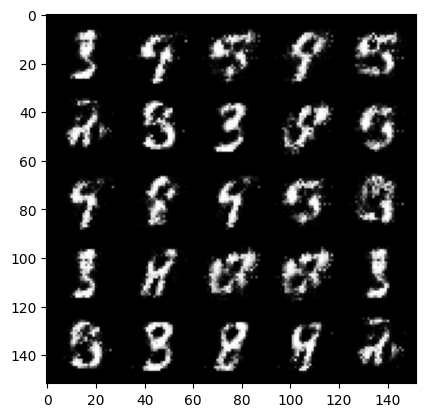

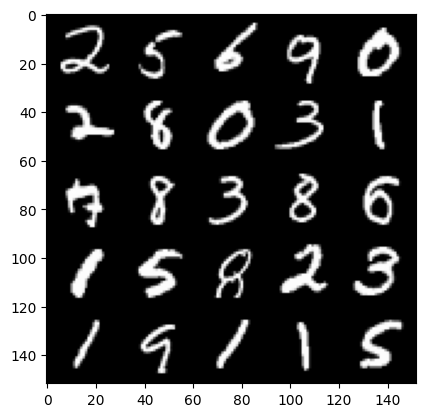

  4%|▍         | 19/469 [00:00<00:09, 45.02it/s]

Step 15500: Generator loss: 3.460877084732052, discriminator loss: 0.14072017860412583


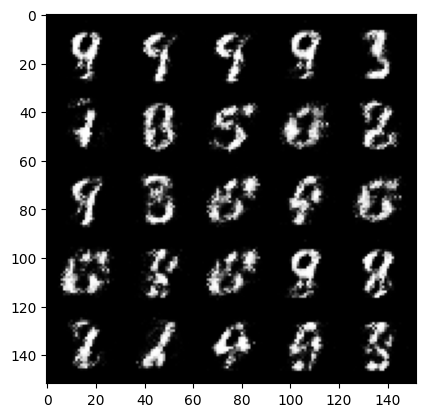

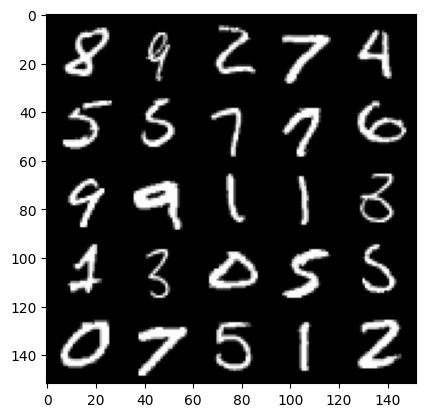

 12%|█▏        | 54/469 [00:01<00:09, 44.06it/s]

Step 16000: Generator loss: 3.3089045095443725, discriminator loss: 0.1412565636634827


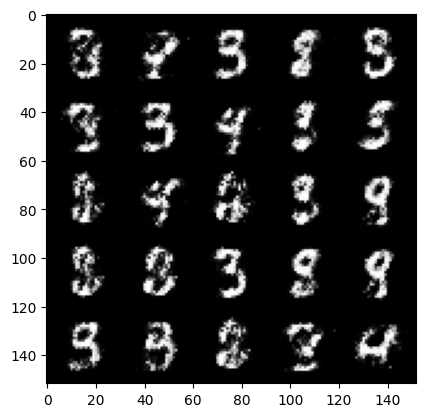

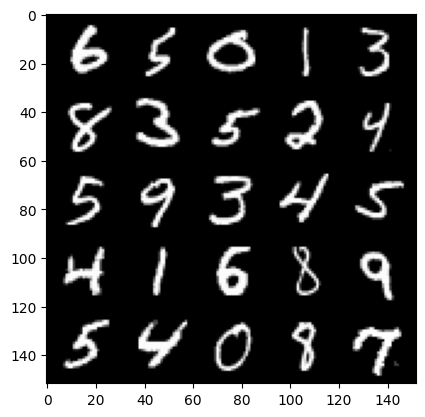

 17%|█▋        | 81/469 [00:02<00:11, 32.52it/s]

Step 16500: Generator loss: 3.285783004760742, discriminator loss: 0.16214637410640725


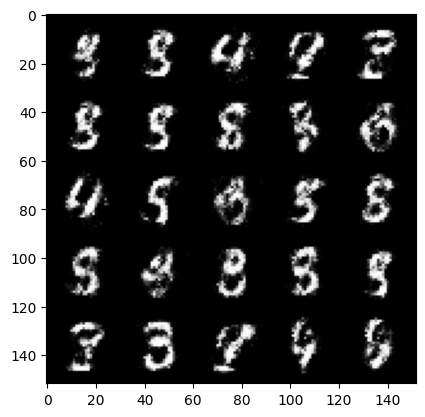

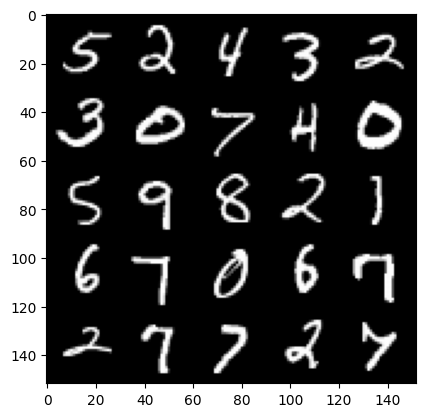

 24%|██▍       | 114/469 [00:03<00:11, 32.27it/s]

Step 17000: Generator loss: 3.225663256168368, discriminator loss: 0.16965634034574018


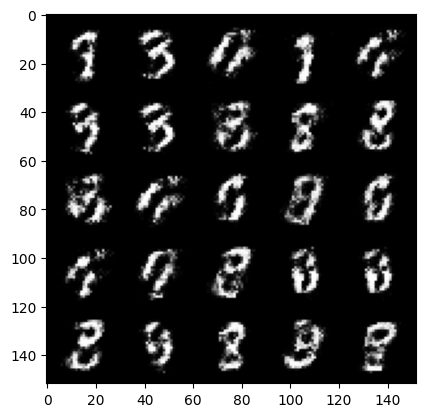

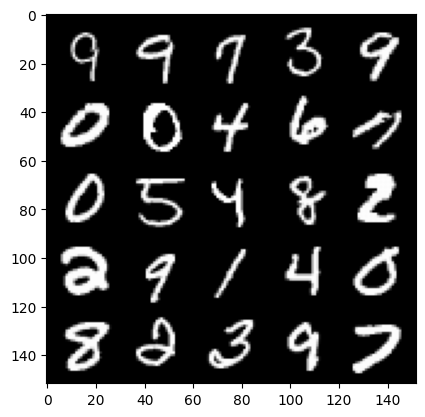

 31%|███       | 145/469 [00:04<00:08, 36.57it/s]

Step 17500: Generator loss: 3.1589984145164505, discriminator loss: 0.15731433638930326


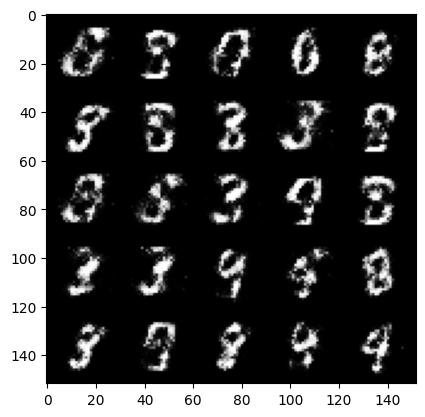

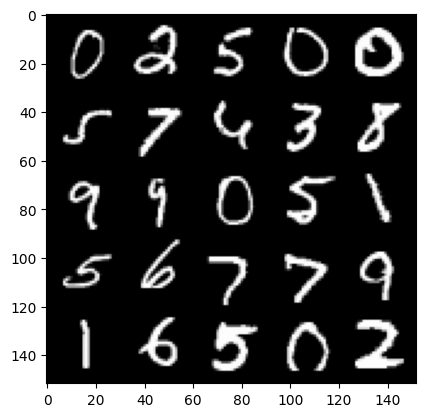

 38%|███▊      | 178/469 [00:04<00:06, 41.98it/s]

Step 18000: Generator loss: 3.079615489482877, discriminator loss: 0.16918306517601


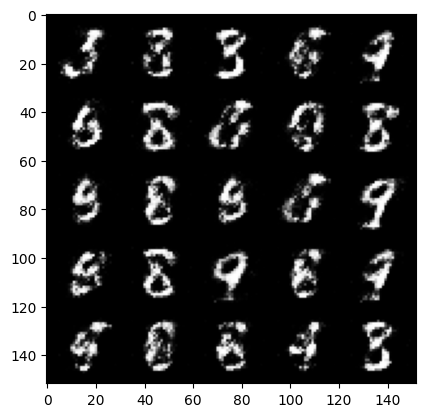

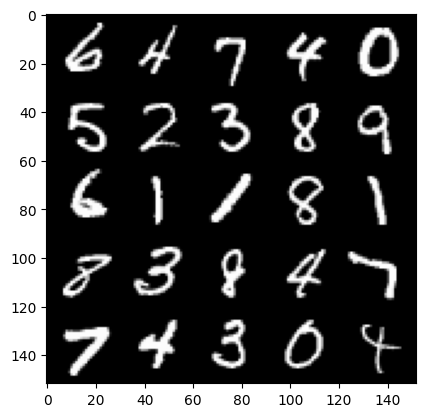

 45%|████▍     | 209/469 [00:06<00:08, 31.90it/s]

Step 18500: Generator loss: 3.116955864906311, discriminator loss: 0.17319902670383439


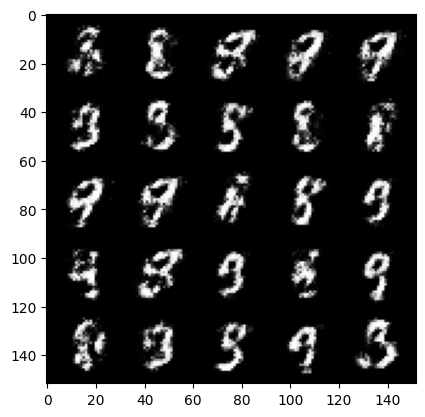

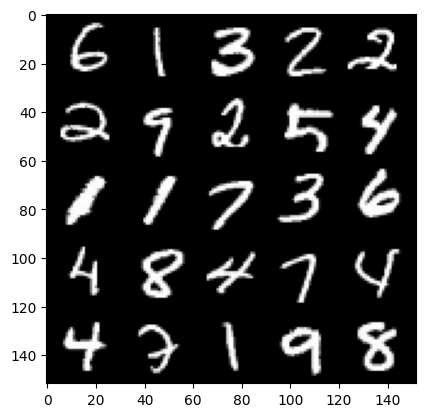

 51%|█████     | 239/469 [00:06<00:07, 30.99it/s]

Step 19000: Generator loss: 3.1077710561752308, discriminator loss: 0.16553441336750974


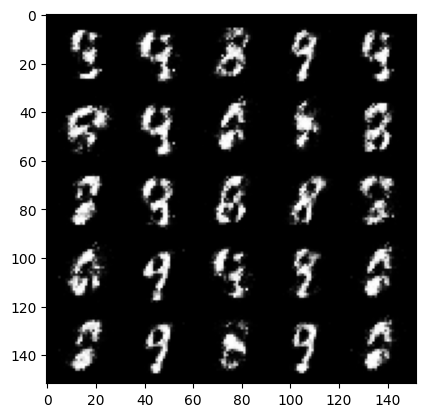

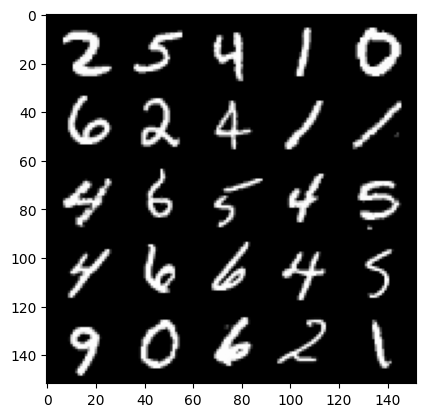

 58%|█████▊    | 271/469 [00:07<00:05, 36.45it/s]

Step 19500: Generator loss: 2.9220116438865644, discriminator loss: 0.20812972639501082


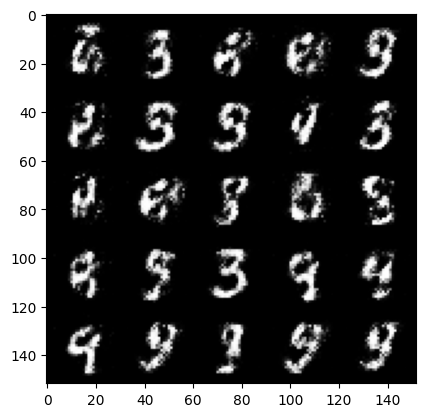

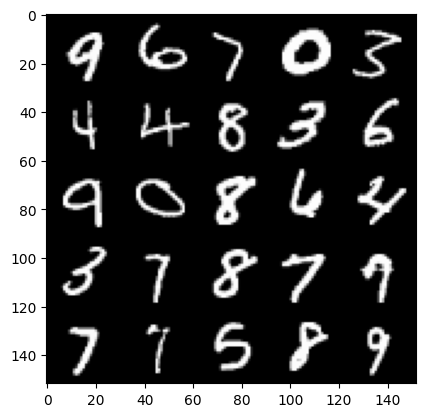

 64%|██████▍   | 301/469 [00:08<00:04, 37.95it/s]

Step 20000: Generator loss: 2.950631911277773, discriminator loss: 0.18371008184552187


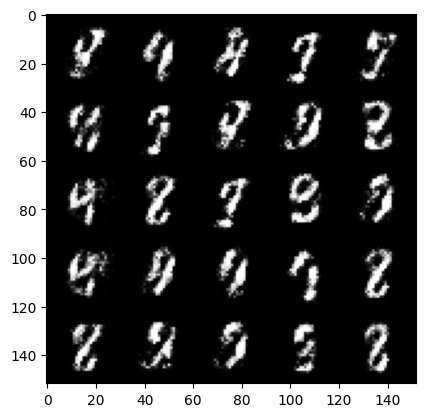

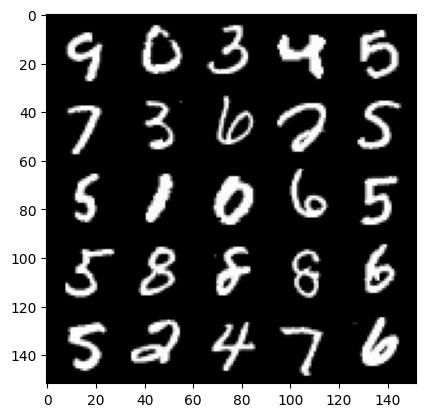

 70%|███████   | 330/469 [00:08<00:03, 44.79it/s]

Step 20500: Generator loss: 2.9870832080841065, discriminator loss: 0.1856836140602826


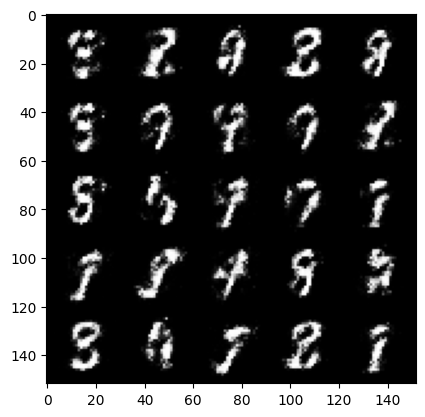

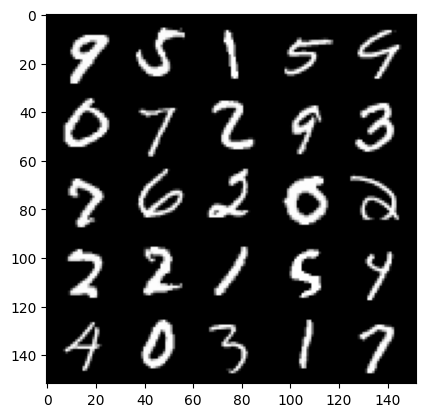

 78%|███████▊  | 364/469 [00:08<00:02, 38.85it/s]

Step 21000: Generator loss: 3.040325835704802, discriminator loss: 0.1830195533335208


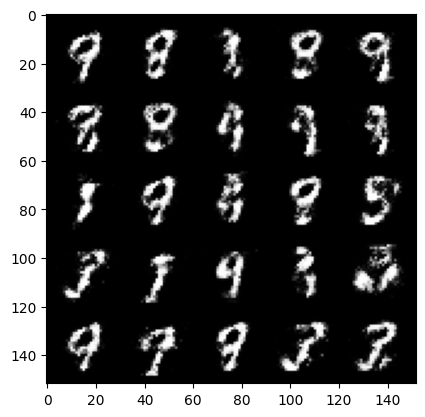

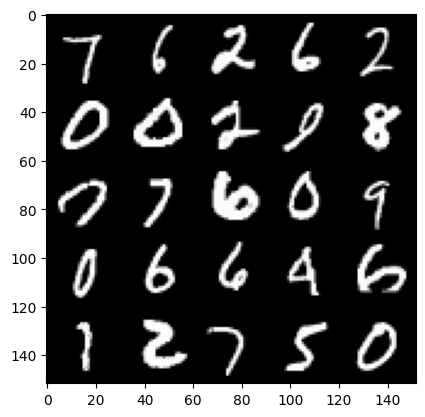

 83%|████████▎ | 391/469 [00:09<00:01, 44.10it/s]

Step 21500: Generator loss: 2.9118840446472163, discriminator loss: 0.19278350864350796


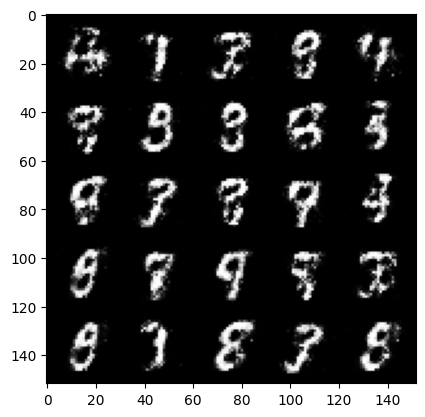

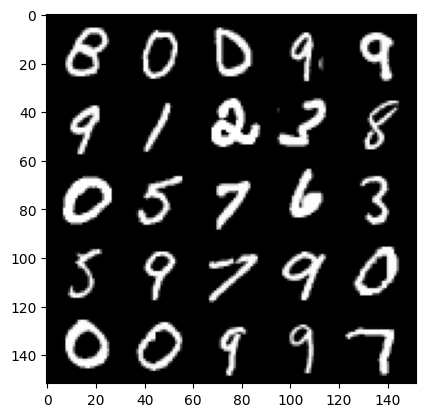

 90%|█████████ | 423/469 [00:11<00:00, 49.25it/s]

Step 22000: Generator loss: 2.967007653236392, discriminator loss: 0.19345438741147522


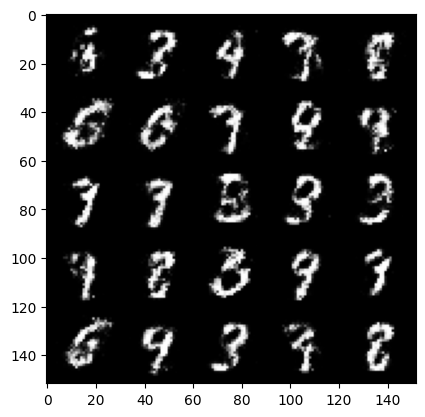

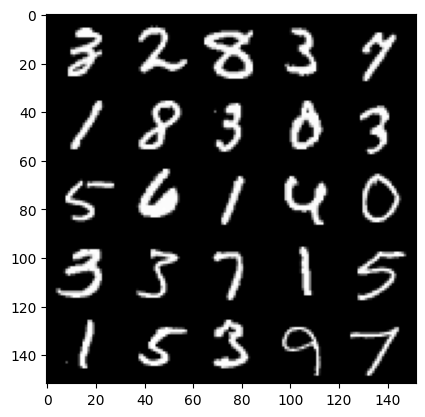

 97%|█████████▋| 457/469 [00:11<00:00, 43.30it/s]

Step 22500: Generator loss: 2.876659990787508, discriminator loss: 0.20691129986941817


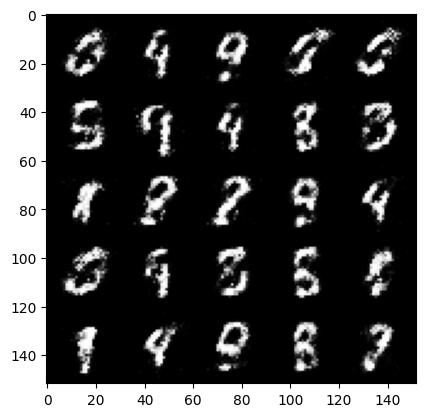

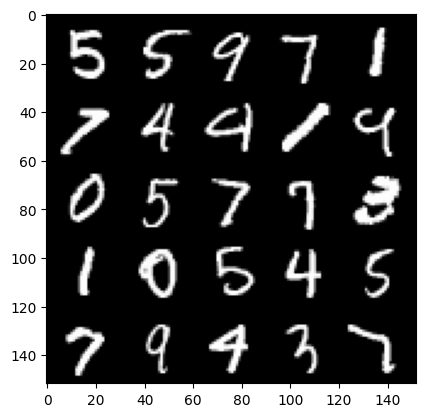

  3%|▎         | 16/469 [00:00<00:13, 33.08it/s]

Step 23000: Generator loss: 2.799141331672667, discriminator loss: 0.20101220022141925


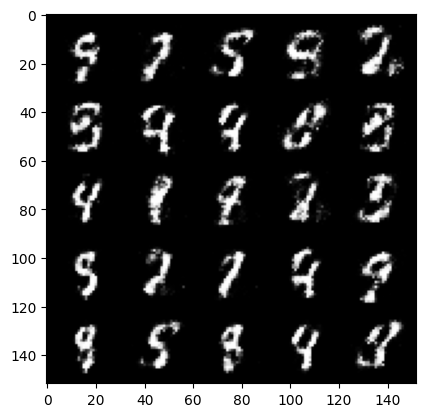

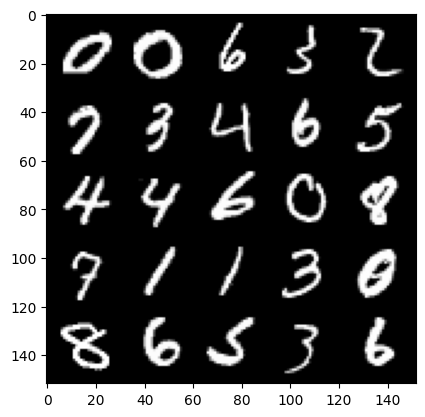

 10%|█         | 48/469 [00:01<00:10, 39.57it/s]

Step 23500: Generator loss: 2.8239133028984083, discriminator loss: 0.19890471892058853


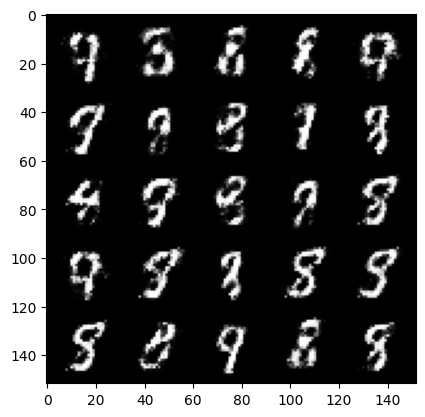

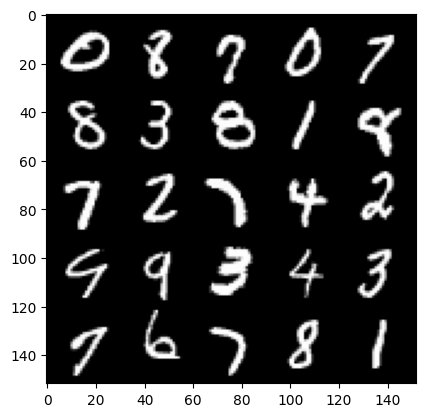

 17%|█▋        | 78/469 [00:01<00:09, 42.38it/s]

Step 24000: Generator loss: 2.7420385680198653, discriminator loss: 0.21098415875434867


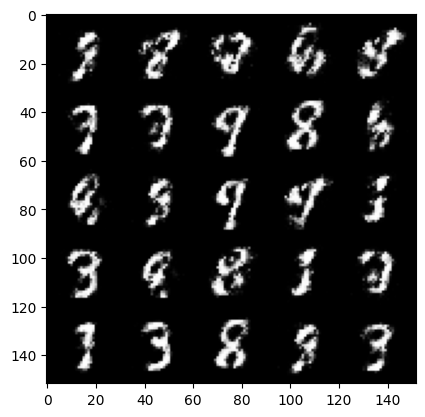

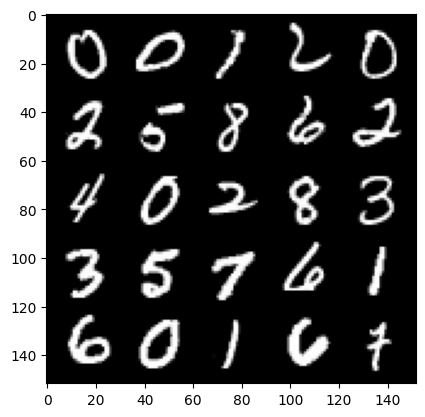

 23%|██▎       | 109/469 [00:03<00:09, 37.12it/s]

Step 24500: Generator loss: 2.6496460204124452, discriminator loss: 0.2173346586674454


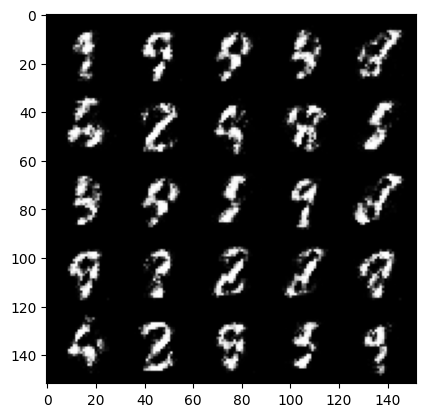

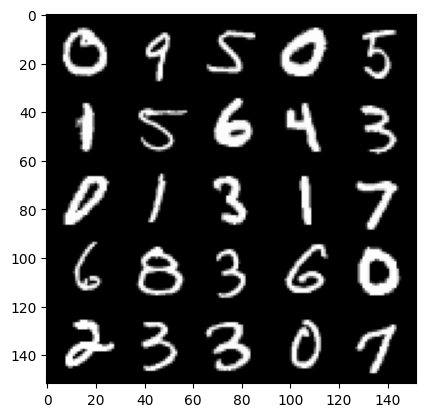

 30%|███       | 141/469 [00:04<00:08, 39.65it/s]

Step 25000: Generator loss: 2.746516490936279, discriminator loss: 0.2115828490555288


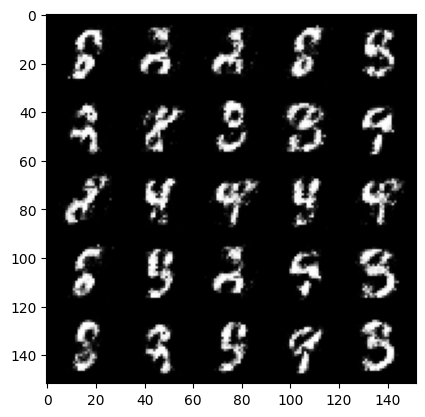

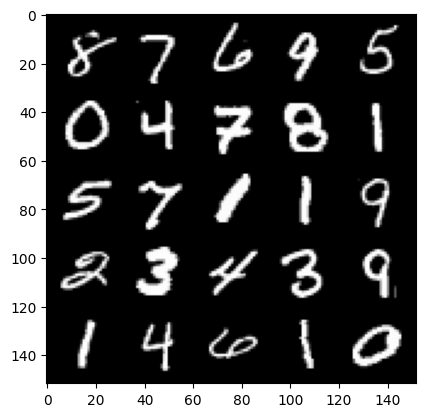

 37%|███▋      | 172/469 [00:04<00:09, 32.27it/s]

Step 25500: Generator loss: 2.875257510185244, discriminator loss: 0.20558233660459524


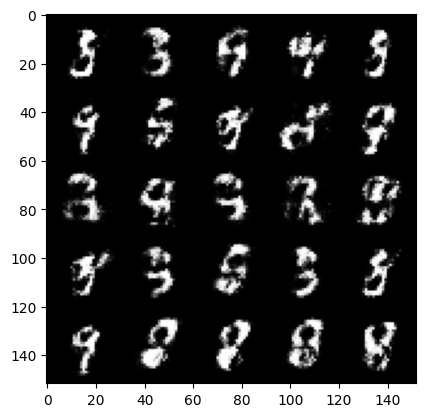

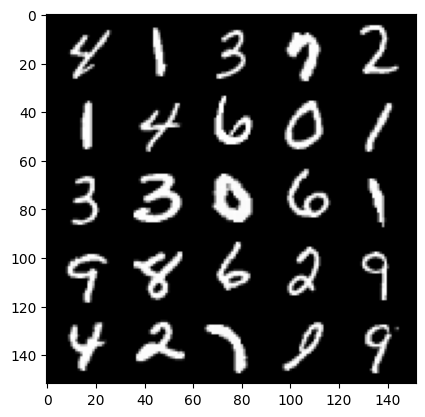

 43%|████▎     | 202/469 [00:05<00:08, 30.16it/s]

Step 26000: Generator loss: 2.618702374696729, discriminator loss: 0.24407949557900424


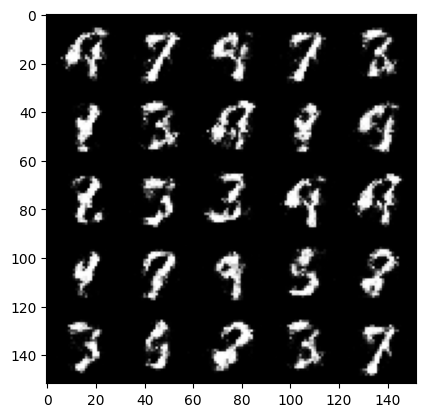

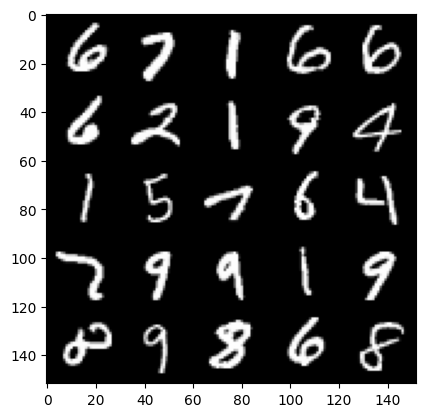

 50%|█████     | 236/469 [00:06<00:06, 36.34it/s]

Step 26500: Generator loss: 2.604295821189879, discriminator loss: 0.2562266007363797


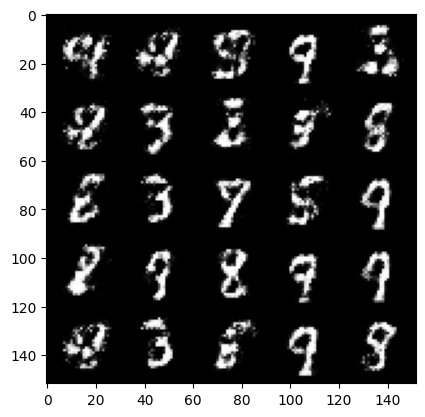

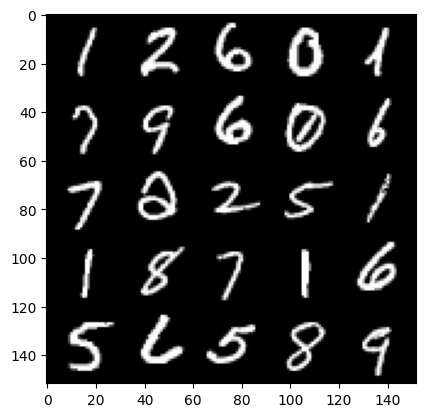

 57%|█████▋    | 267/469 [00:06<00:04, 43.45it/s]

Step 27000: Generator loss: 2.611838111877442, discriminator loss: 0.23355029454827309


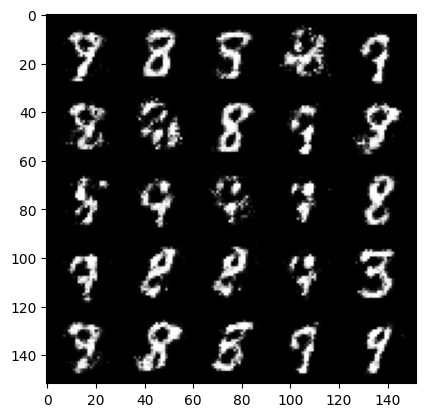

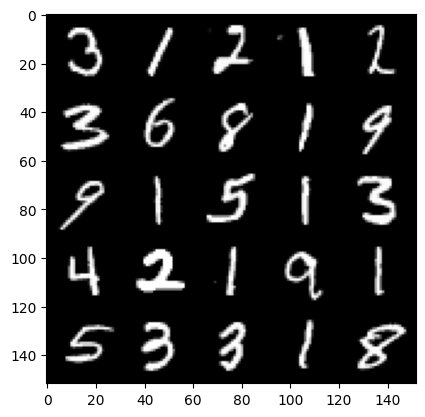

 64%|██████▎   | 298/469 [00:08<00:05, 33.24it/s]

Step 27500: Generator loss: 2.632091367721558, discriminator loss: 0.23713449442386625


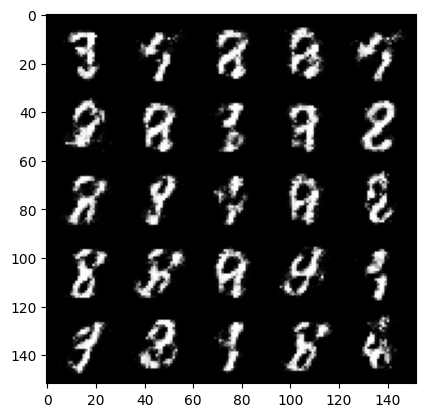

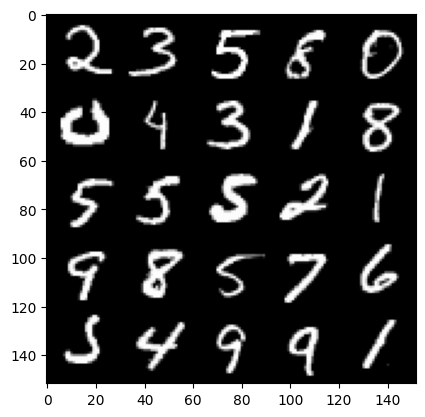

 70%|██████▉   | 327/469 [00:08<00:03, 40.82it/s]

Step 28000: Generator loss: 2.5164310505390155, discriminator loss: 0.24985126718878736


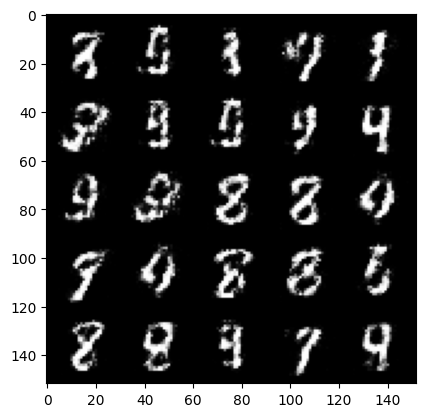

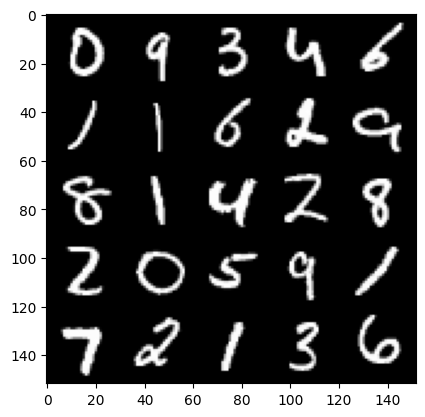

 76%|███████▋  | 358/469 [00:09<00:03, 33.68it/s]

Step 28500: Generator loss: 2.5493373932838423, discriminator loss: 0.24041556084156054


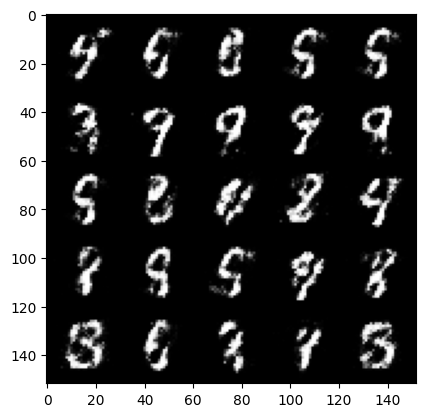

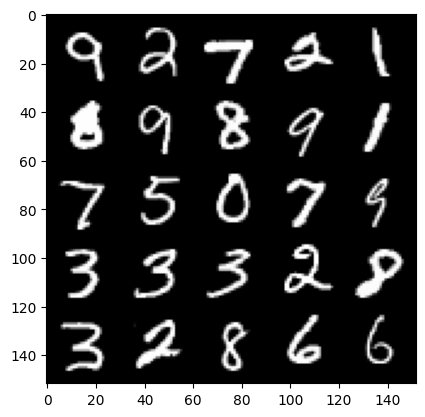

 83%|████████▎ | 391/469 [00:11<00:02, 37.24it/s]

Step 29000: Generator loss: 2.473512083053589, discriminator loss: 0.2607101719975472


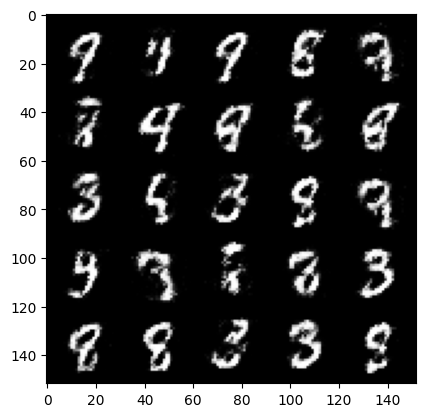

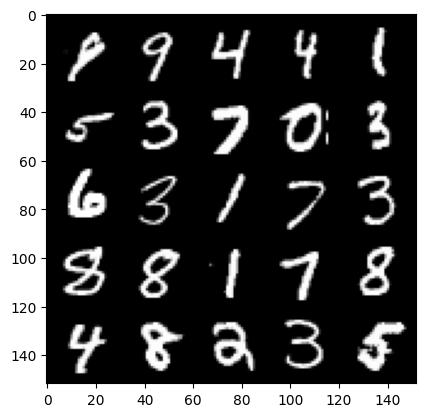

 90%|████████▉ | 422/469 [00:11<00:01, 33.20it/s]

Step 29500: Generator loss: 2.4664703011512756, discriminator loss: 0.25268929150700564


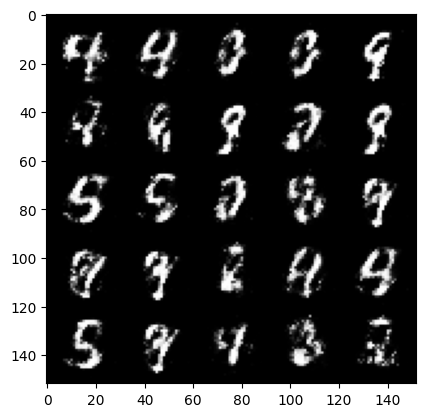

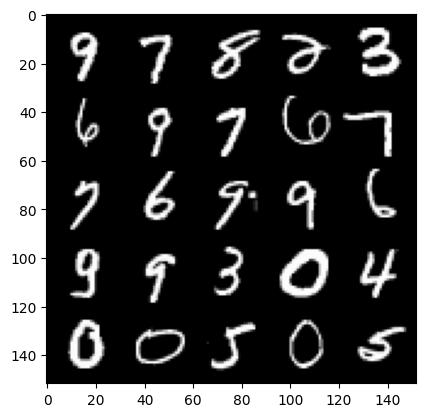

 97%|█████████▋| 453/469 [00:11<00:00, 39.16it/s]

Step 30000: Generator loss: 2.4197859201431307, discriminator loss: 0.2602035161256793


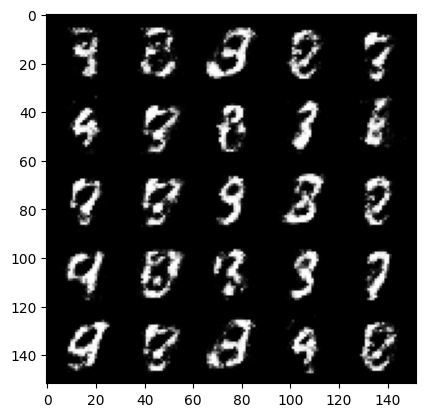

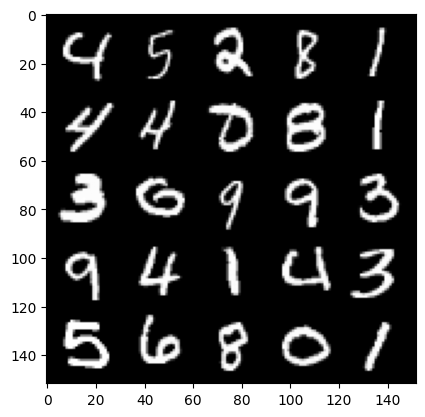

  3%|▎         | 14/469 [00:00<00:14, 32.47it/s]

Step 30500: Generator loss: 2.382128023147583, discriminator loss: 0.27522744104266195


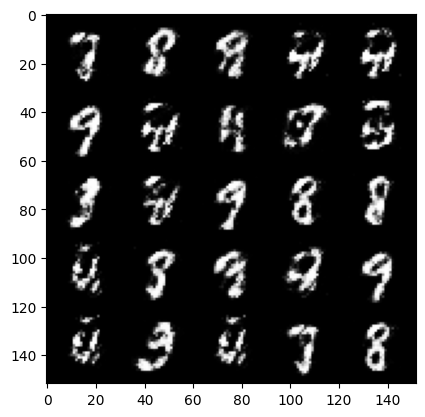

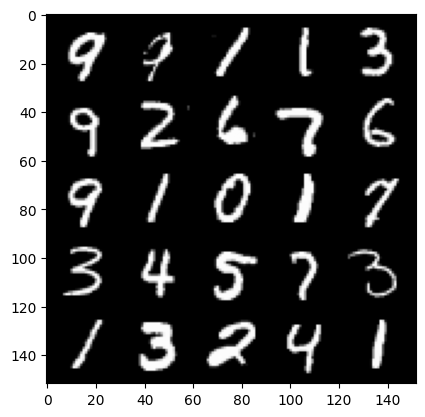

 10%|▉         | 45/469 [00:04<00:37, 11.43it/s]

Step 31000: Generator loss: 2.432118895053862, discriminator loss: 0.26038680419325827


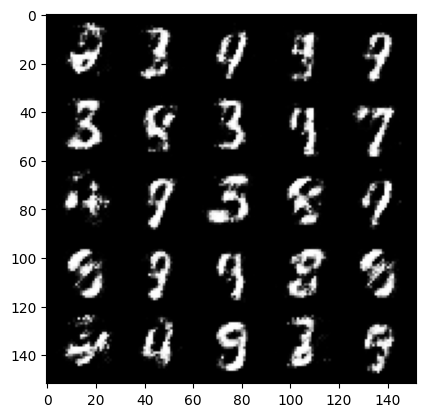

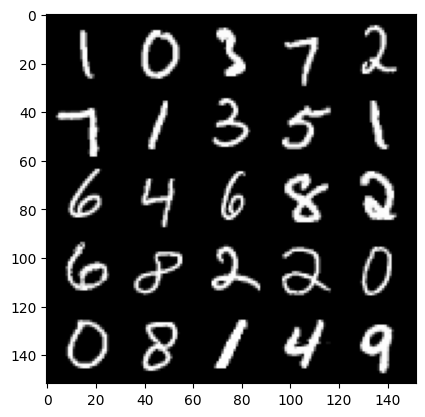

 16%|█▌        | 76/469 [00:06<00:35, 10.95it/s]

Step 31500: Generator loss: 2.3377273852825162, discriminator loss: 0.2863932318687438


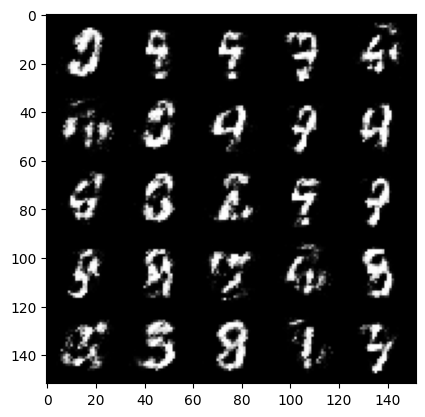

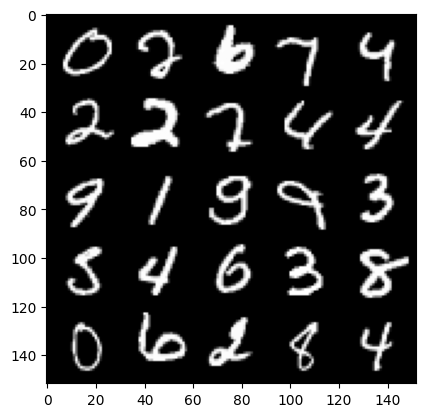

 23%|██▎       | 108/469 [00:03<00:10, 33.22it/s]

Step 32000: Generator loss: 2.306067510843276, discriminator loss: 0.2885861087739468


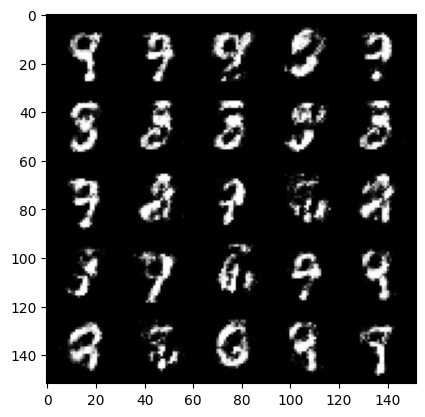

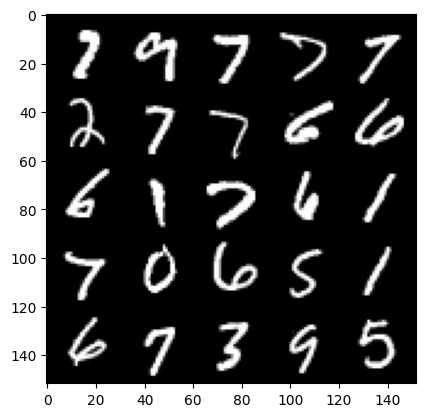

 29%|██▉       | 138/469 [00:03<00:07, 44.98it/s]

Step 32500: Generator loss: 2.28300718998909, discriminator loss: 0.2831048841476439


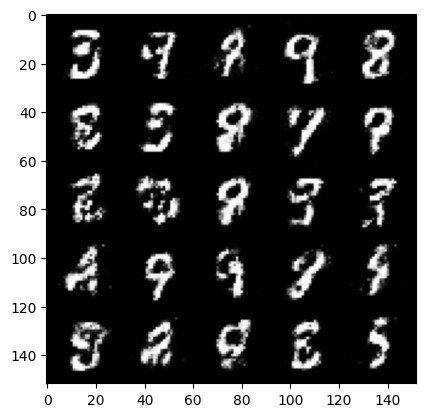

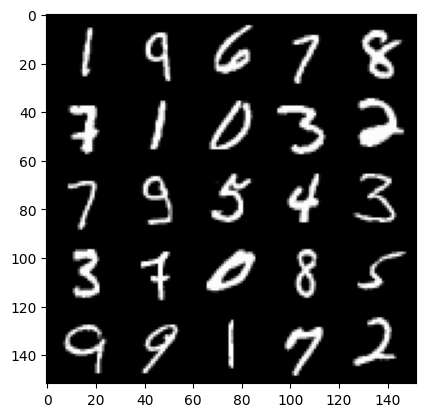

 36%|███▌      | 170/469 [00:04<00:08, 35.12it/s]

Step 33000: Generator loss: 2.3435111434459683, discriminator loss: 0.2818497625887394


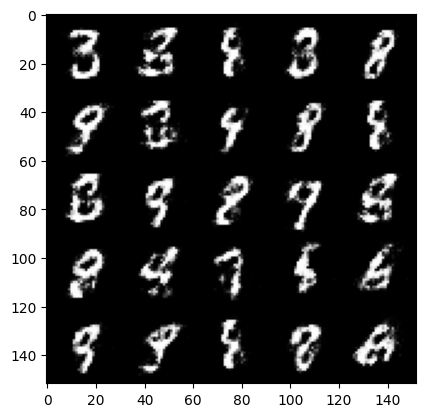

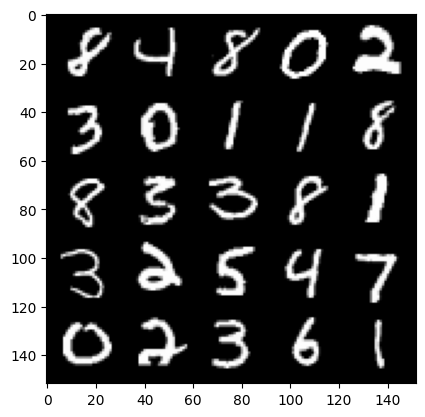

 42%|████▏     | 199/469 [00:04<00:07, 35.32it/s]

Step 33500: Generator loss: 2.2499061095714583, discriminator loss: 0.29677485296130174


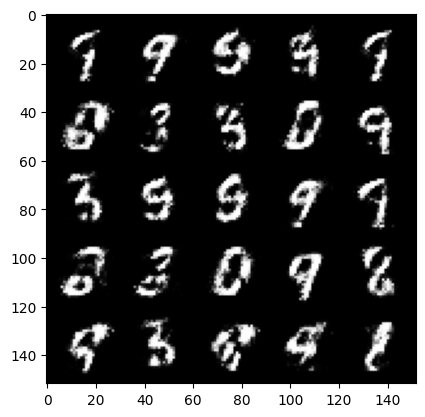

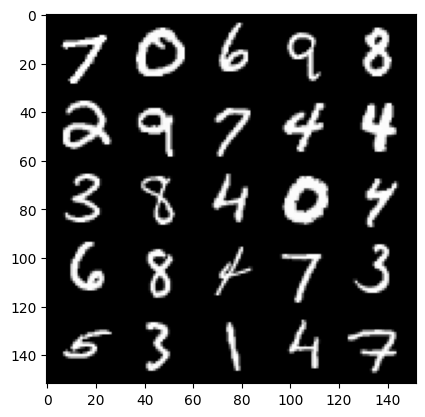

 49%|████▉     | 229/469 [00:06<00:06, 35.65it/s]

Step 34000: Generator loss: 2.1932916650772096, discriminator loss: 0.29434109109640155


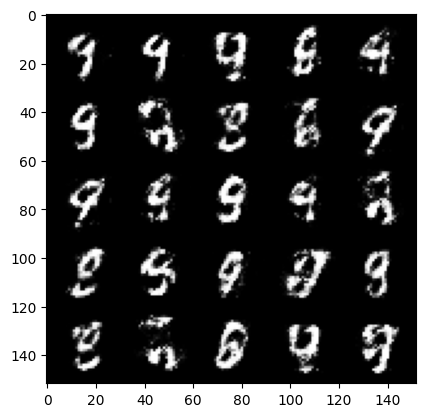

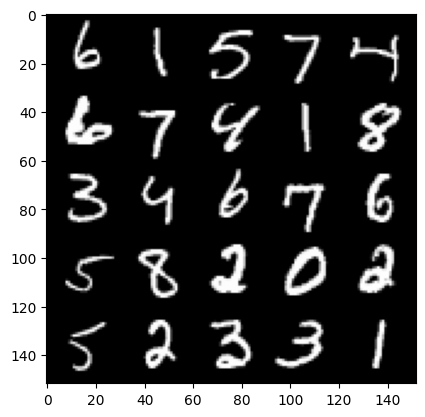

 56%|█████▌    | 262/469 [00:19<00:19, 10.71it/s]

Step 34500: Generator loss: 2.122840154886247, discriminator loss: 0.31310829642415067


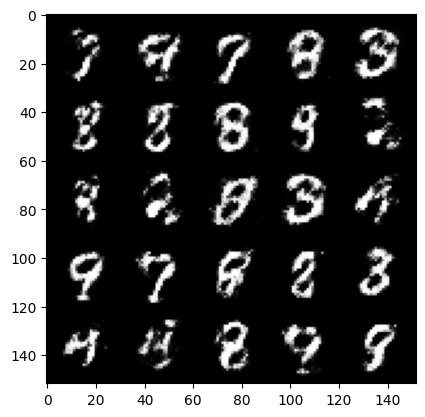

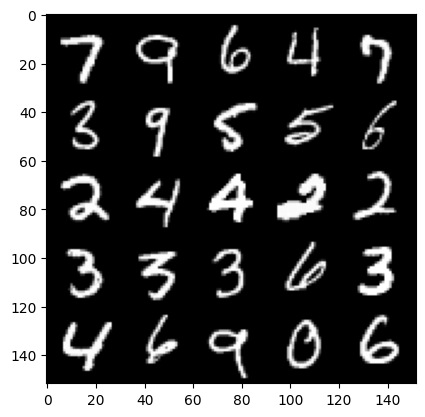

 63%|██████▎   | 294/469 [00:07<00:04, 36.66it/s]

Step 35000: Generator loss: 2.165814079999925, discriminator loss: 0.30441087466478334


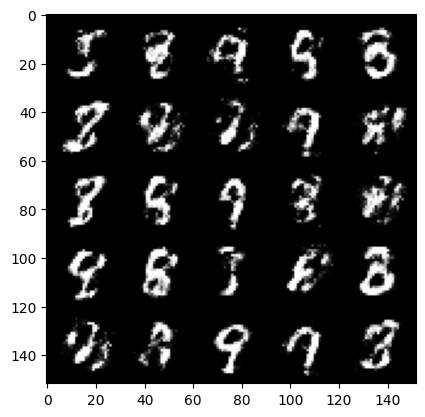

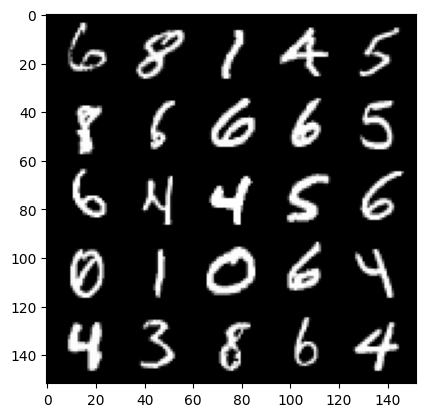

 69%|██████▉   | 325/469 [00:08<00:04, 34.71it/s]

Step 35500: Generator loss: 2.242412900686264, discriminator loss: 0.2844030057489871


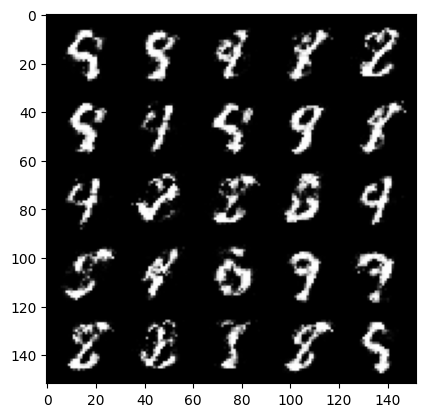

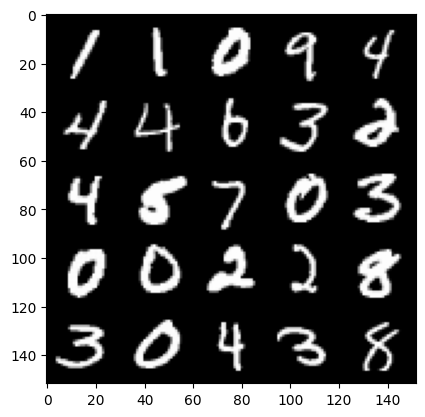

 76%|███████▌  | 356/469 [00:09<00:03, 36.41it/s]

Step 36000: Generator loss: 2.258927976846693, discriminator loss: 0.27799379423260684


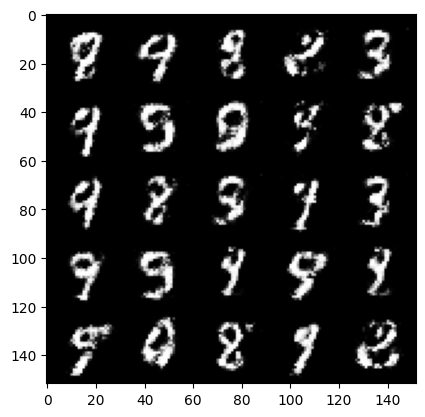

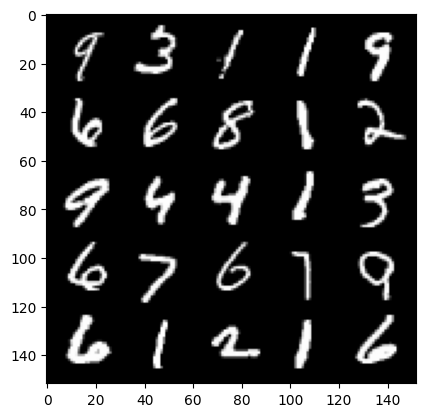

 82%|████████▏ | 385/469 [00:09<00:02, 33.86it/s]

Step 36500: Generator loss: 2.221061198472979, discriminator loss: 0.284898503780365


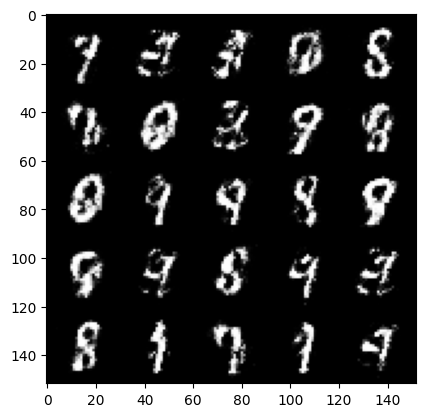

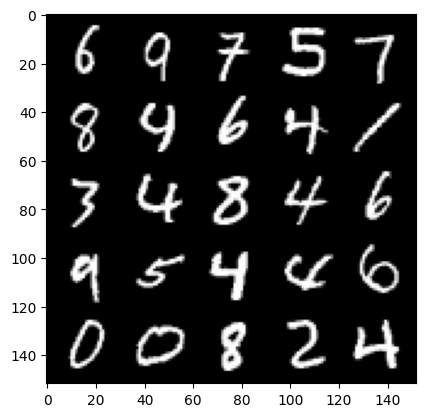

 89%|████████▉ | 418/469 [00:10<00:01, 48.08it/s]

Step 37000: Generator loss: 2.237557926893233, discriminator loss: 0.2786643697321414


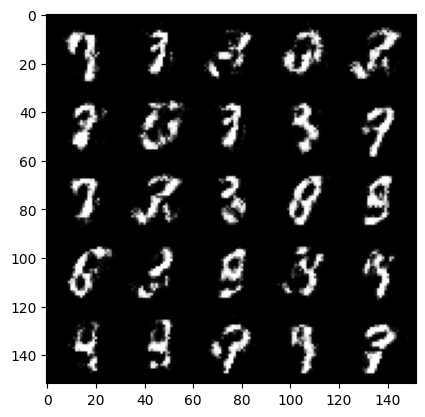

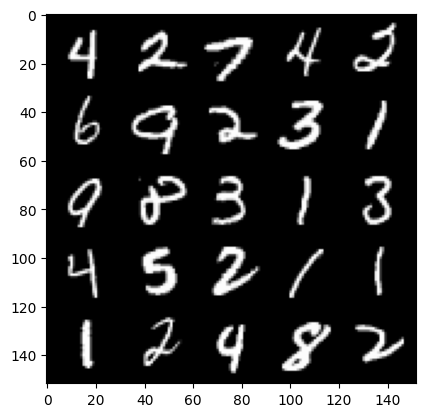

 95%|█████████▍| 445/469 [00:12<00:00, 47.65it/s]

Step 37500: Generator loss: 2.202913469552996, discriminator loss: 0.29636745366454126


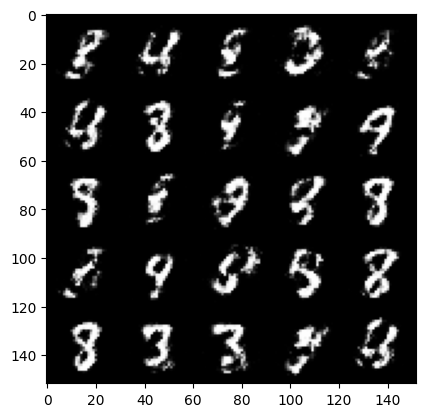

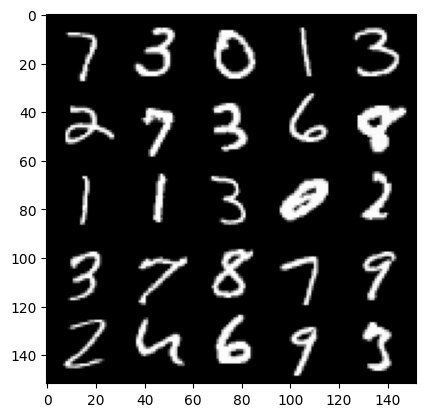

  2%|▏         | 11/469 [00:00<00:09, 49.73it/s]

Step 38000: Generator loss: 2.1211854326724997, discriminator loss: 0.31470086312294016


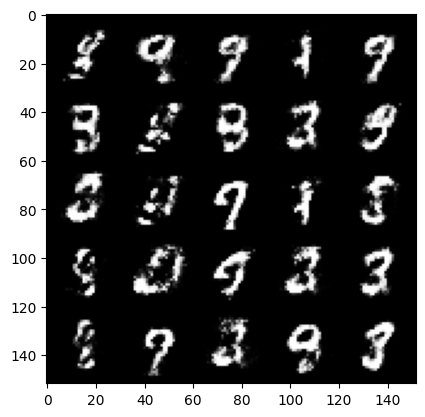

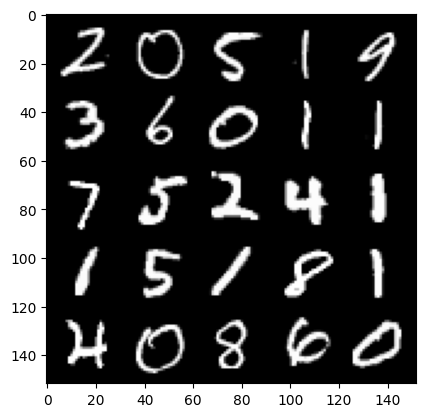

  9%|▉         | 42/469 [00:01<00:11, 36.74it/s]

Step 38500: Generator loss: 2.0771094598770157, discriminator loss: 0.3134143412411212


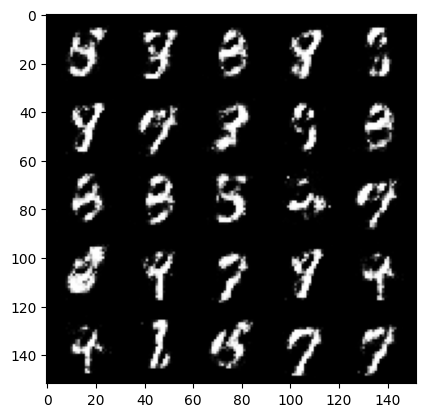

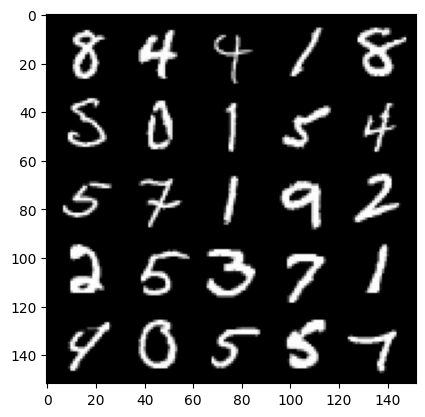

 15%|█▌        | 71/469 [00:01<00:09, 43.30it/s]

Step 39000: Generator loss: 2.1033614602088946, discriminator loss: 0.30437385132908823


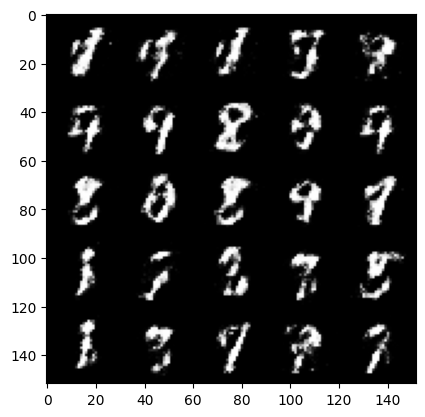

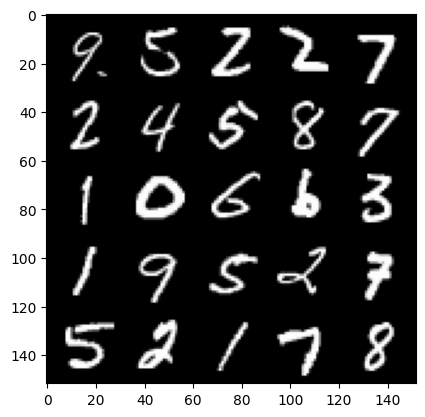

 22%|██▏       | 103/469 [00:03<00:10, 34.50it/s]

Step 39500: Generator loss: 2.0530971071720128, discriminator loss: 0.31291544798016563


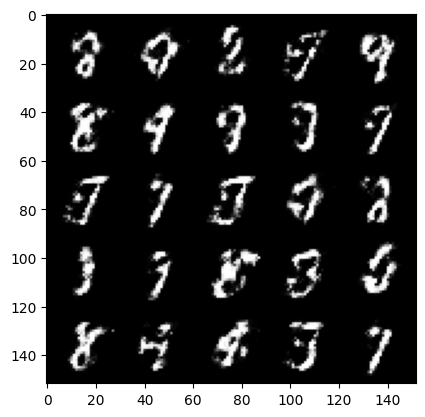

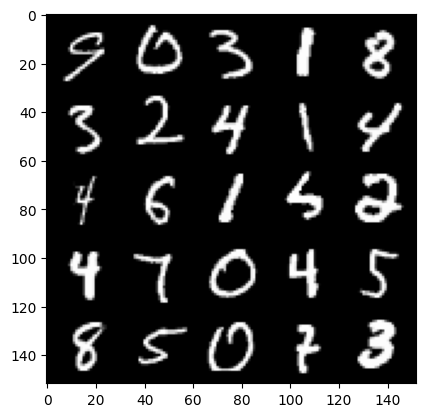

 28%|██▊       | 133/469 [00:03<00:09, 36.19it/s]

Step 40000: Generator loss: 2.0951138393878943, discriminator loss: 0.3090708805620672


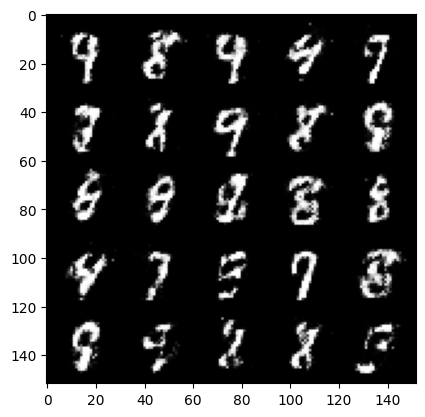

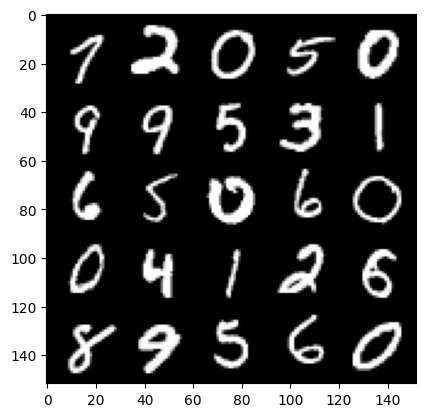

 35%|███▌      | 166/469 [00:04<00:11, 27.27it/s]

Step 40500: Generator loss: 2.180347196102144, discriminator loss: 0.3091528171002866


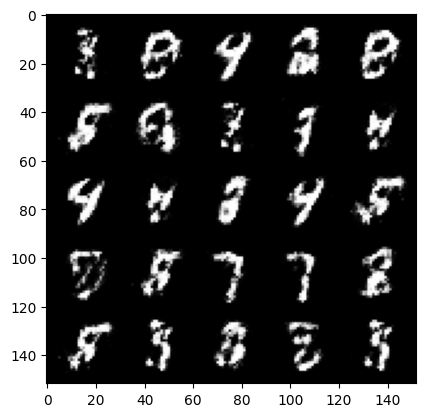

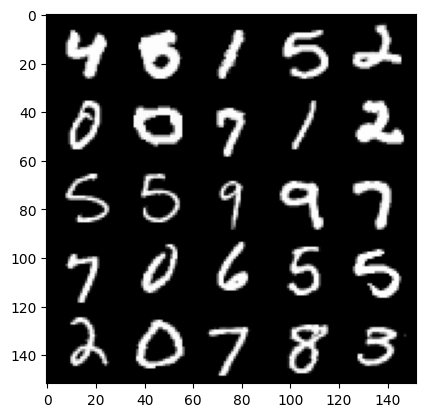

 42%|████▏     | 196/469 [00:05<00:09, 28.58it/s]

Step 41000: Generator loss: 1.9725474588871006, discriminator loss: 0.34053884860873196


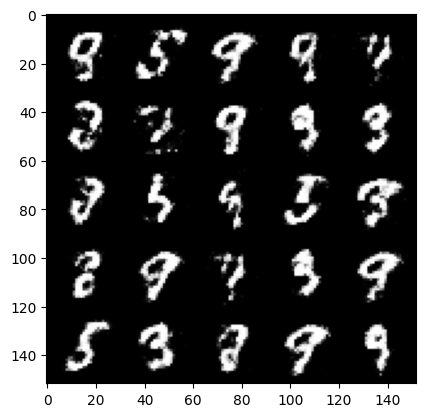

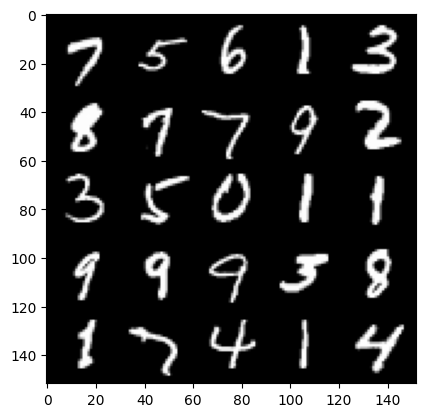

 49%|████▊     | 228/469 [00:06<00:06, 38.47it/s]

Step 41500: Generator loss: 2.153522934436797, discriminator loss: 0.28448152896761913


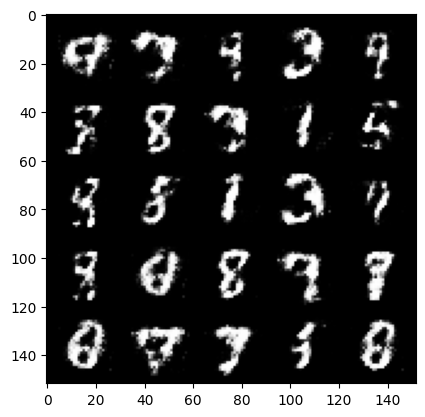

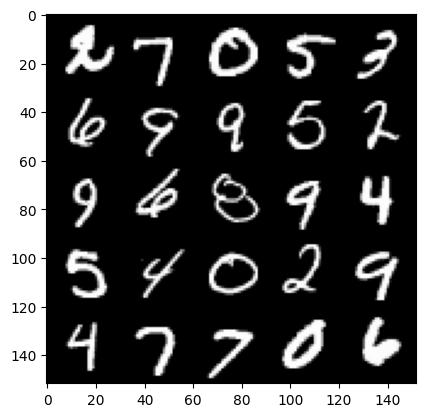

 55%|█████▌    | 259/469 [00:07<00:05, 38.14it/s]

Step 42000: Generator loss: 2.051638322114946, discriminator loss: 0.3093444764614102


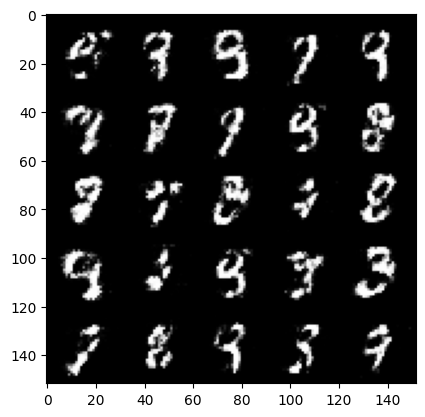

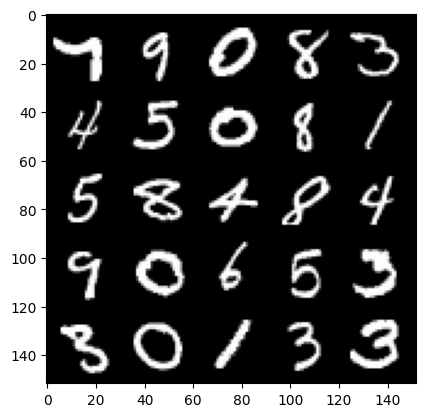

 61%|██████    | 287/469 [00:08<00:05, 31.46it/s]

Step 42500: Generator loss: 2.100627428293229, discriminator loss: 0.29445547342300427


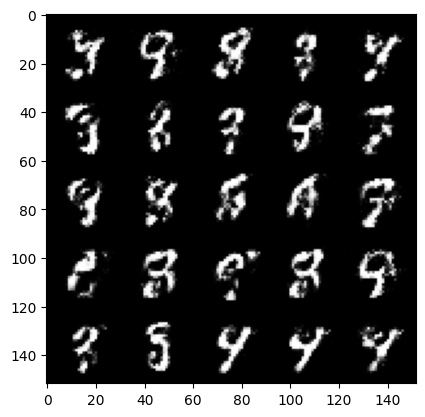

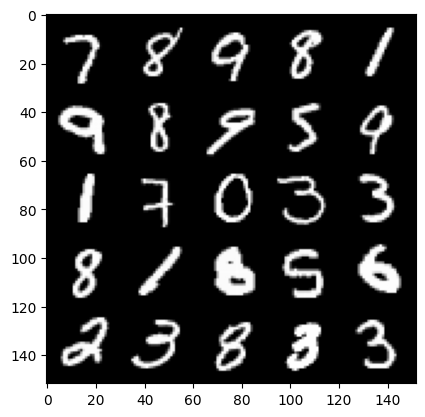

 68%|██████▊   | 320/469 [00:09<00:04, 31.36it/s]

Step 43000: Generator loss: 2.223470329999924, discriminator loss: 0.2808728730976583


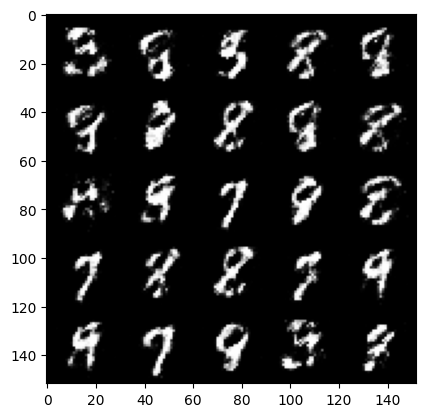

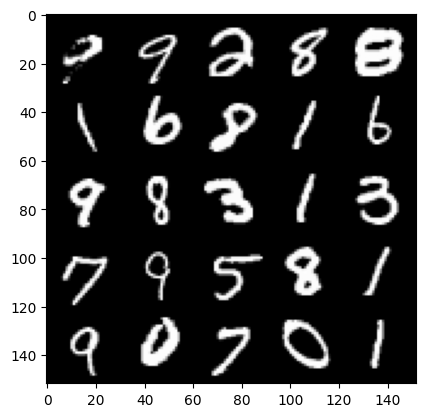

 75%|███████▌  | 352/469 [00:09<00:03, 32.21it/s]

Step 43500: Generator loss: 2.1237314865589143, discriminator loss: 0.30206017002463315


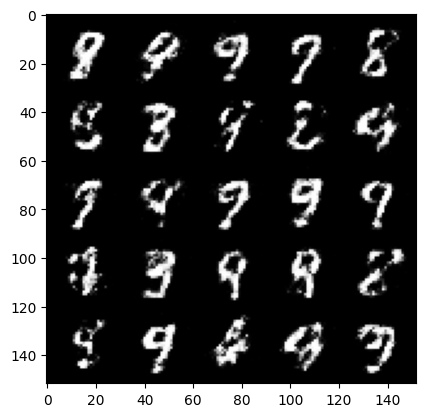

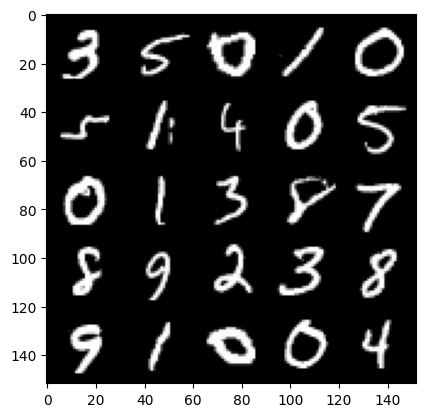

 81%|████████▏ | 382/469 [00:10<00:02, 38.08it/s]

Step 44000: Generator loss: 2.0512770562171934, discriminator loss: 0.30595111766457556


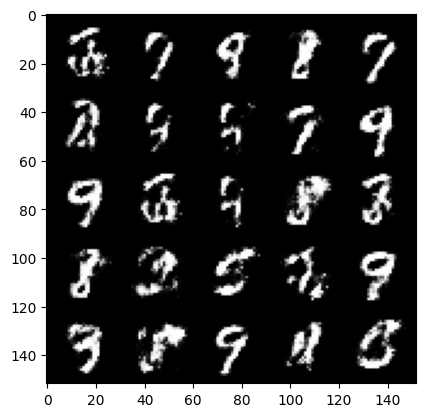

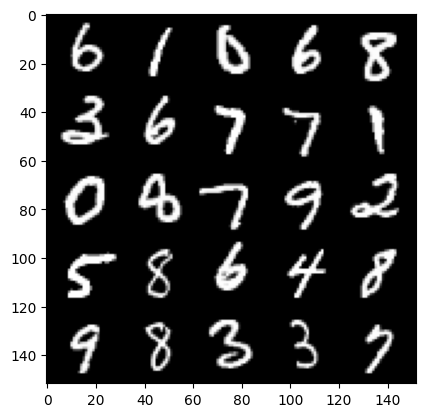

 88%|████████▊ | 412/469 [00:10<00:01, 35.28it/s]

Step 44500: Generator loss: 2.040564949989318, discriminator loss: 0.3116312189102173


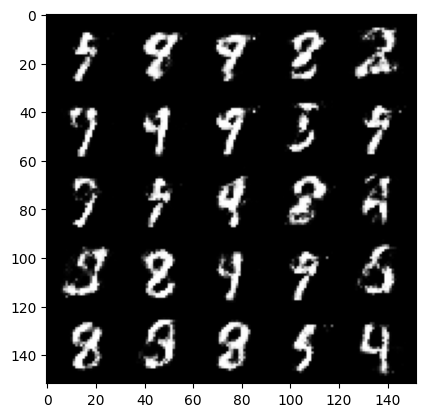

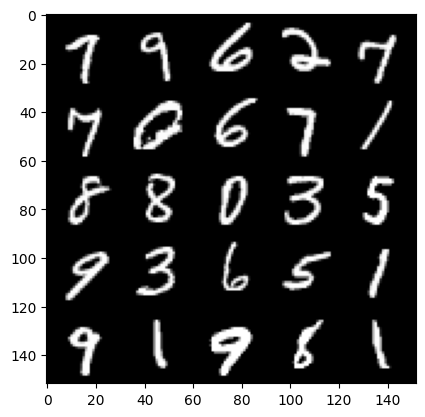

 95%|█████████▍| 445/469 [00:11<00:00, 45.67it/s]

Step 45000: Generator loss: 2.0936881594657892, discriminator loss: 0.29959924823045714


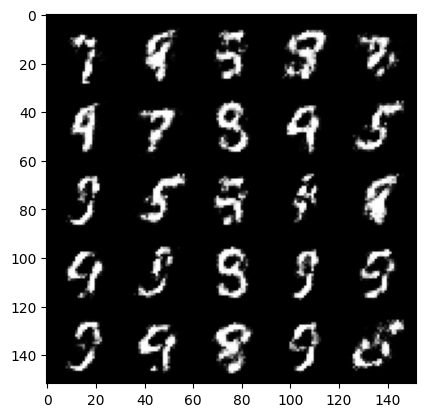

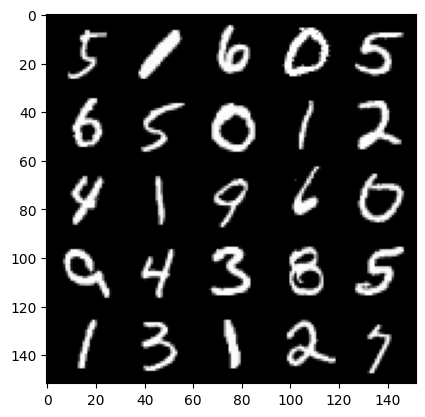

  1%|          | 5/469 [00:00<00:09, 47.10it/s]

Step 45500: Generator loss: 2.154510916709899, discriminator loss: 0.29409610384702684


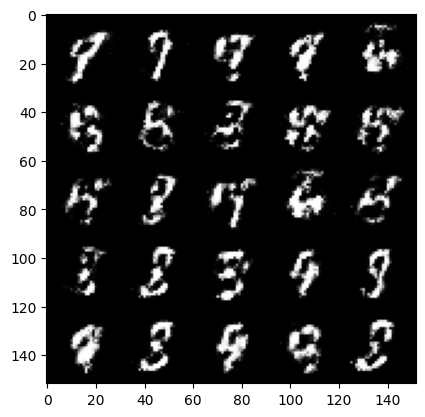

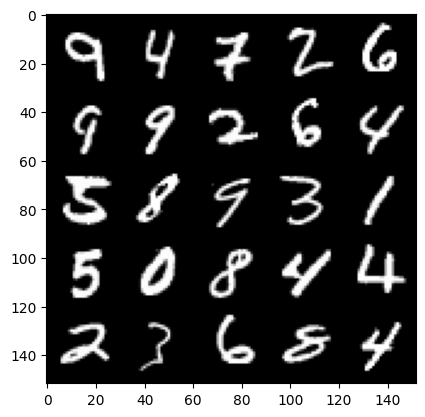

  8%|▊         | 37/469 [00:00<00:11, 37.35it/s]

Step 46000: Generator loss: 1.9484505126476286, discriminator loss: 0.3366506010890008


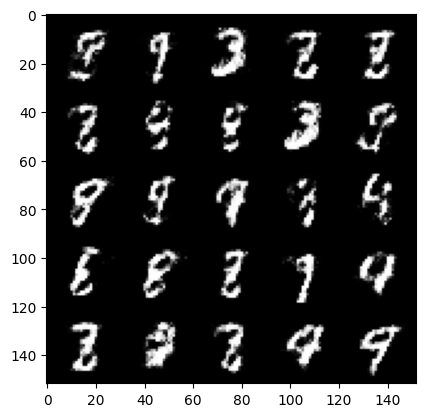

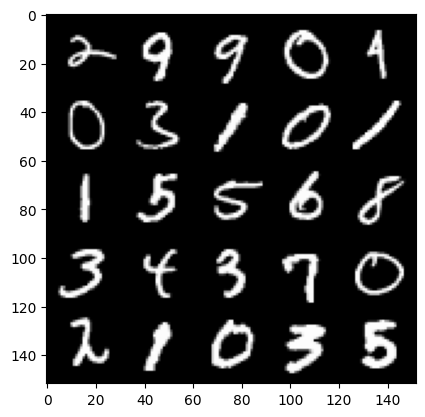

 14%|█▍        | 68/469 [00:01<00:10, 36.81it/s]

Step 46500: Generator loss: 2.0915915451049805, discriminator loss: 0.30560314679145845


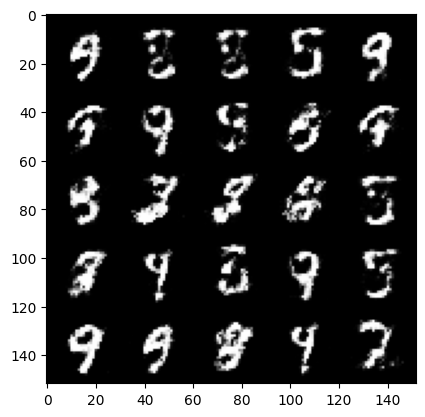

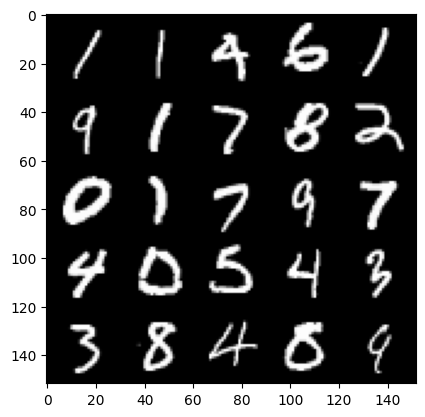

 20%|██        | 96/469 [00:02<00:09, 39.40it/s]

Step 47000: Generator loss: 2.028515104532242, discriminator loss: 0.3221125124990943


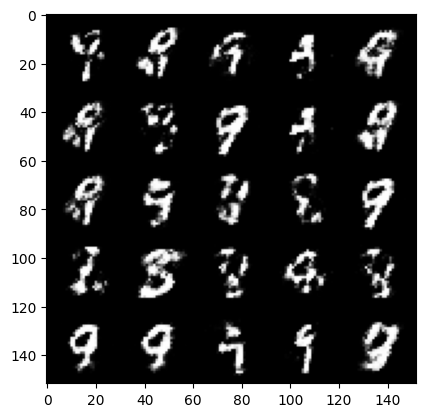

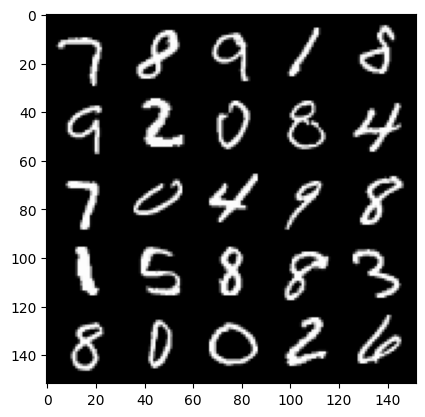

 28%|██▊       | 129/469 [00:03<00:09, 37.09it/s]

Step 47500: Generator loss: 1.9575816633701337, discriminator loss: 0.3368836967945102


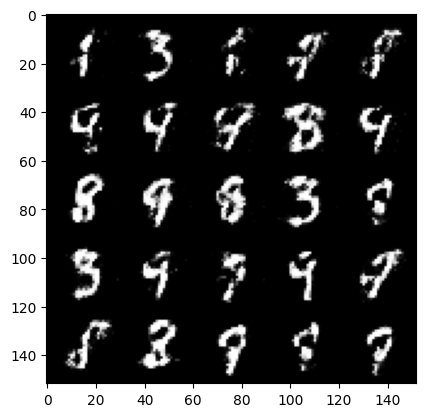

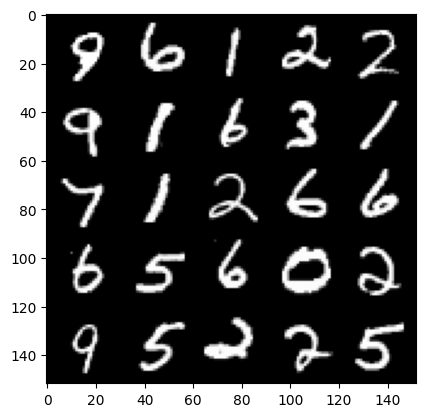

 34%|███▍      | 160/469 [00:04<00:06, 44.59it/s]

Step 48000: Generator loss: 2.06181700348854, discriminator loss: 0.28787852105498307


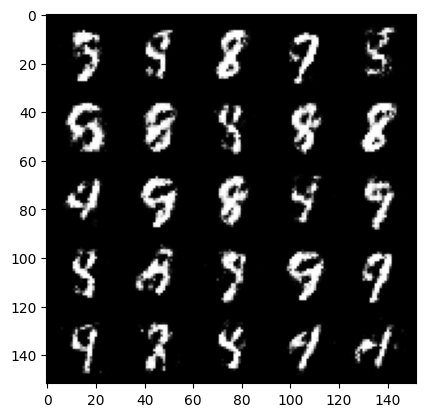

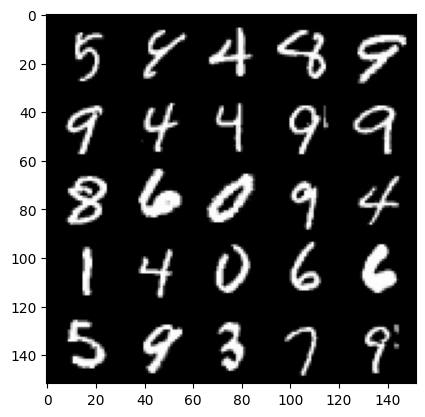

 34%|███▍      | 159/469 [00:04<00:08, 37.28it/s]


KeyboardInterrupt: 

In [16]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True
gen_loss = False
error = False

for epoch in range(n_epochs):

    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        real = real.view(cur_batch_size,-1).to(device)

        disc_opt.zero_grad()

        disc_loss = get_disc_loss(gen,disc,criterion,real,cur_batch_size,z_dim,device)

        disc_loss.backward(retain_graph=True)

        disc_opt.step()

        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        gen_opt.zero_grad()

        gen_loss = get_gen_loss(gen,disc,criterion,cur_batch_size,z_dim,device)

        gen_loss.backward()

        gen_opt.step()

        if test_generator:
            try:
                assert lr > 0.0000002 or (
                    gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0
                )
                assert torch.any(
                    gen.gen[0][0].weight.detach().clone() != old_generator_weights
                )
            except:
                error = True
                print("Runtime tests have failed")
            

        mean_discriminator_loss += disc_loss.item() / display_step
        mean_generator_loss += gen_loss.item() / display_step

        if cur_step % display_step == 0 and cur_step > 0:
            print(
                f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}"
            )
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0 
            mean_discriminator_loss = 0
        cur_step += 1